In [ ]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from coffea import util
from coffea.processor import accumulate
import os
import re
import pandas as pd
import hist
import sys
sys.path.append("/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools")
import plotTools as ptools

In [2]:
f_sig = "signal_2018_aEM.coffea"
sig = util.load(f_sig)[0]

bkg_files = {
    "QCD":"bkg_2018_QCD_TuneCP5_PSWeights.coffea",
    "Top":"bkg_2018_Top.coffea",
    "DY":"bkg_2018_DY.coffea",
    "Diboson":"bkg_2018_Diboson.coffea",
    "Triboson":"bkg_2018_Triboson.coffea",
    "W+jets":"bkg_2018_WJets.coffea",
    "Z+jets":"bkg_2018_ZJets.coffea"
}
bkg_histos = {}
histograms = []
for b in bkg_files.keys():
    bkg_histos[b] = util.load(bkg_files[b])[0]
    histograms = list(bkg_histos[b].keys())
bkg = {}
for h in histograms:
    if type(bkg_histos['QCD'][h]) == hist.Hist and bkg_histos['QCD'][h].sum(flow=True).value > 0:
        bkg[h] = {b:bkg_histos[b][h][{"samp":sum}] for b in bkg_histos.keys()}

In [3]:
cutflows = ['cutDesc', 'cutflow', 'cutflow_cts']
histos = [k for k in sig.keys() if k not in cutflows]
sig_samples = list(sig['cutflow'].keys())
si = pd.DataFrame.from_dict({s:ptools.signalPoint(s) for s in sig_samples},orient='index')
cuts = list(sig['cutflow'][sig_samples[0]].keys())
cutNames = {cname:ptools.getCut(sig['cutDesc'][cname]) for cname in sig['cutDesc'].keys()}
deltas = sorted(list(set(si.delta)))
ctaus = sorted(list(set(si.ctau)))

In [4]:
print("\n".join(histos))

sel_e1_pt
sel_e1_trkIso
sel_e1_trkRelIso
sel_e1_PFRelIso3
sel_e1_PFRelIso4
sel_e1_PFRelIso8
sel_e1_PFIso3
sel_e1_PFIso4
sel_e1_PFIso8
sel_e1_trkChi2
sel_e1_trkProb
sel_e1_dxy
sel_e1_dxySignif
sel_e1_angRes
sel_e2_pt
sel_e2_trkIso
sel_e2_trkRelIso
sel_e2_PFRelIso3
sel_e2_PFRelIso4
sel_e2_PFRelIso8
sel_e2_PFIso3
sel_e2_PFIso4
sel_e2_PFIso8
sel_e2_trkChi2
sel_e2_trkProb
sel_e2_dxy
sel_e2_dxySignif
sel_e2_angRes
sel_e1_pt_vs_trkIso
sel_e1_pt_vs_trkRelIso
sel_e1_pt_vs_chi2
sel_e1_chi2_vs_dxy
sel_e1_numHits_vs_trkChi2
sel_e1_numHits_vs_trkProb
sel_e2_pt_vs_trkIso
sel_e2_pt_vs_trkRelIso
sel_e2_pt_vs_chi2
sel_e2_chi2_vs_dxy
sel_e2_numHits_vs_trkChi2
sel_e2_numHits_vs_trkProb
sel_vtx_type
sel_vtx_sign
sel_vtx_dR
sel_vtx_dR_over_pT
sel_vtx_dR_over_m
sel_vtx_dR_over_pTm
sel_vtx_dR_over_mpT
sel_vtx_chi2
sel_vtx_prob
sel_vtx_vxy
sel_vtx_vxy_zoom
sel_vtx_vxy_zoomzoom
sel_vtx_vxySignif
sel_vtx_mass
sel_vtx_minDxy
sel_vtx_pt
sel_vtx_eta
sel_vtx_phi
sel_vtx_PFRelIso3
sel_vtx_PFRelIso3M
sel_vtx_PFRelIso

In [7]:
def plotNminus1(hname,xlim=None,cut="cut13",loc='best',logy=False,logx=False,tickx=None,lessThan=True,xlabel=None):
    hb = sum([bkg[hname][b][{"cut":cut}] for b in bkg_histos.keys()])
    varAx = hb.axes[-1]
    for delta in deltas:
        plt.figure(figsize=(16,4))
        m1s = sorted(list(set(si[si.delta==delta].m1)))
        for i,ct in enumerate(ctaus):
            plt.subplot(1,4,i+1)
            plt.title(r"$c\tau = {0}$ mm".format(ct))
            for m1 in m1s:
                point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
                hs = sig[hname][point,cut,:]
                x,signif = ptools.makeNMinus1(hs,hb,lessThan=lessThan)
                plt.plot(x,signif,'o-',markersize=4,label=r"$M_1 = {0}$".format(m1))
            plt.xlabel(f"{varAx.label} cut",fontsize=14)
            if xlim:
                plt.xlim(xlim)
            if tickx:
                plt.xticks(ticks=np.arange(xlim[0],xlim[1]+tickx,tickx),rotation=45)
            if i==0:
                plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
                plt.legend(loc=loc)
            if logy:
                plt.yscale('log')
            if logx:
                plt.xscale('log')
            if xlabel:
                plt.xlabel(xlabel+" cut")
            plt.grid()
        plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
        plt.tight_layout()
        if lessThan:
            plt.savefig(f"plots/Nminus1/{hname}_{cut}_delta-{delta:.1f}.pdf")
        else:
            plt.savefig(f"plots/Nminus1/{hname}_{cut}_delta-{delta:.1f}_greaterThan.pdf")
    plt.figure(figsize=(8,6))


# Existing Cuts

/uscms_data/d3/sbrightt/miniforge/envs/coffea/lib/python3.8/site-packages/hist/basehist.py:324: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


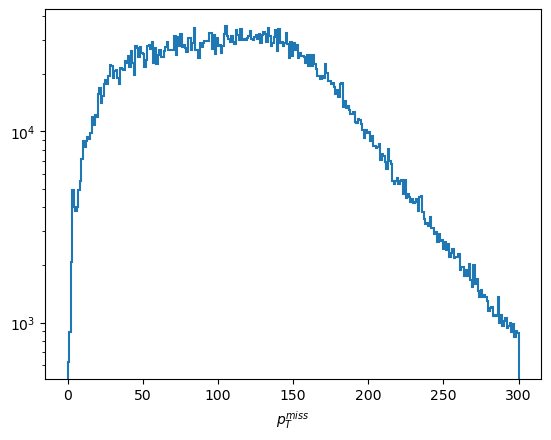

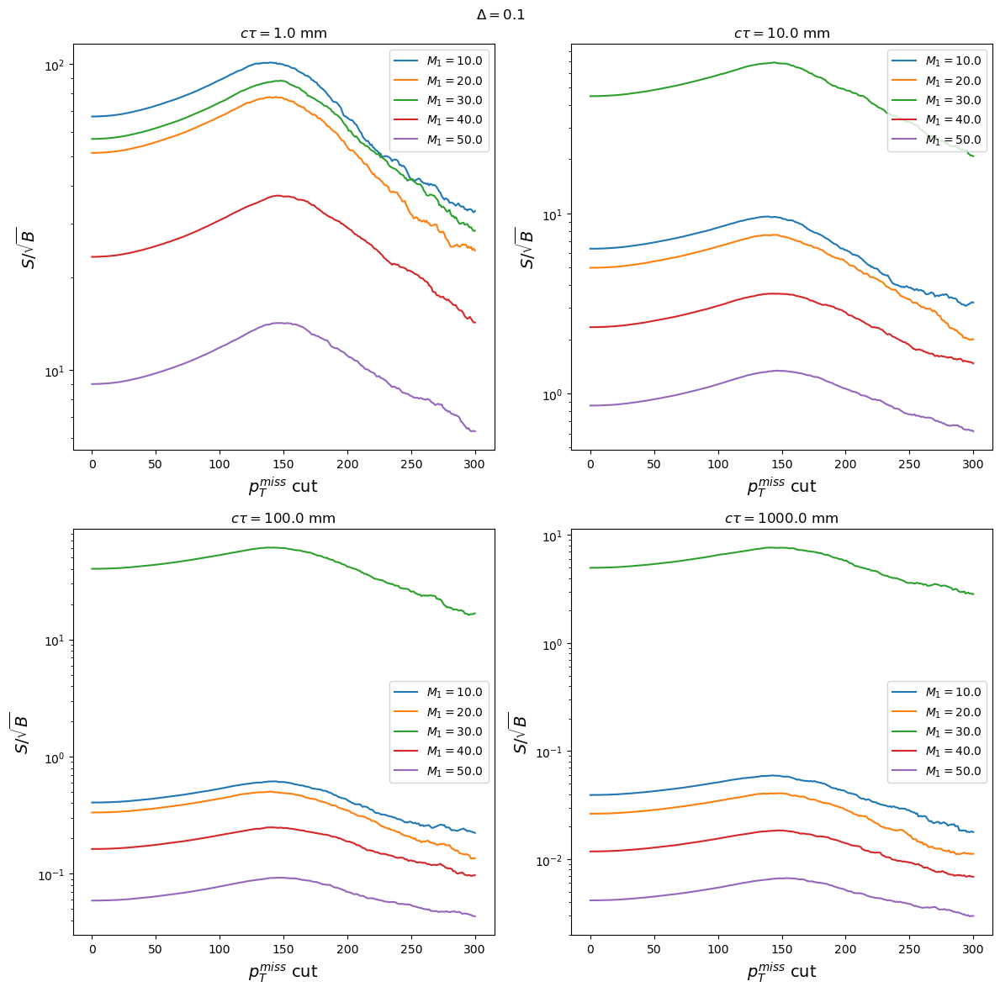

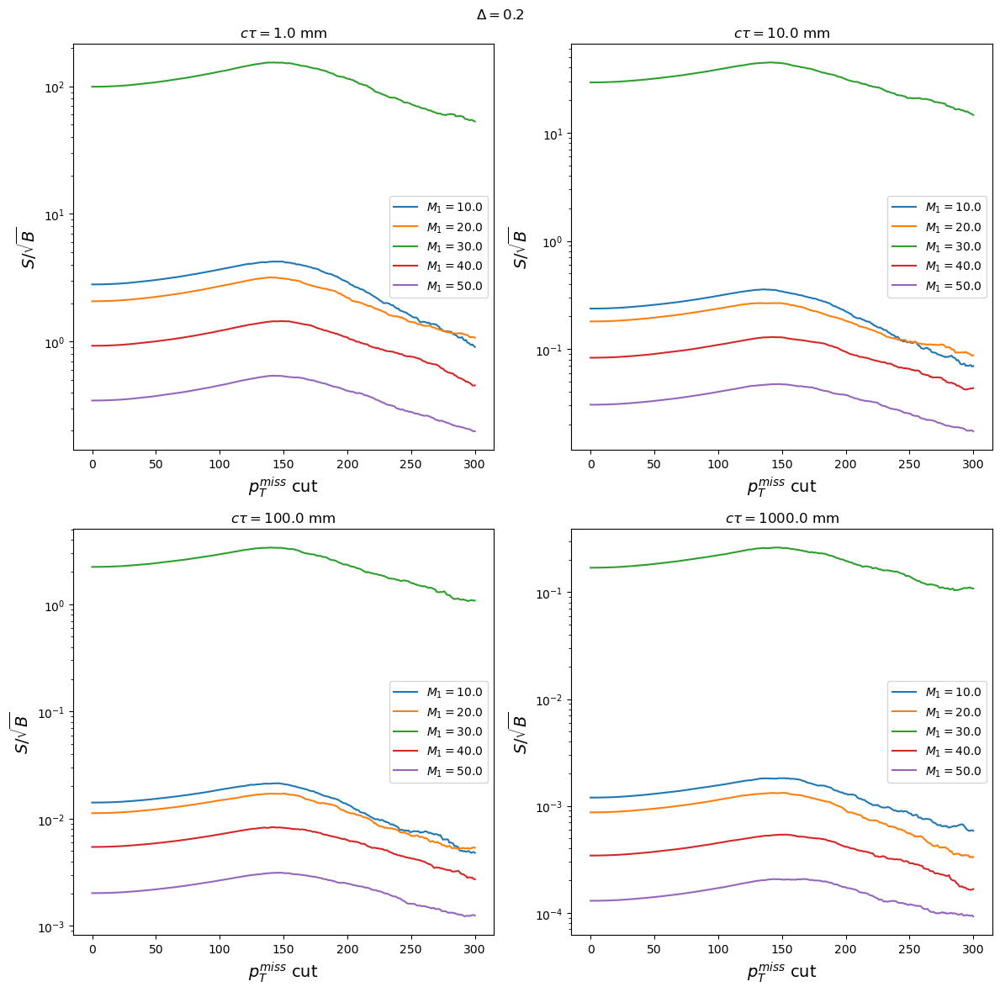

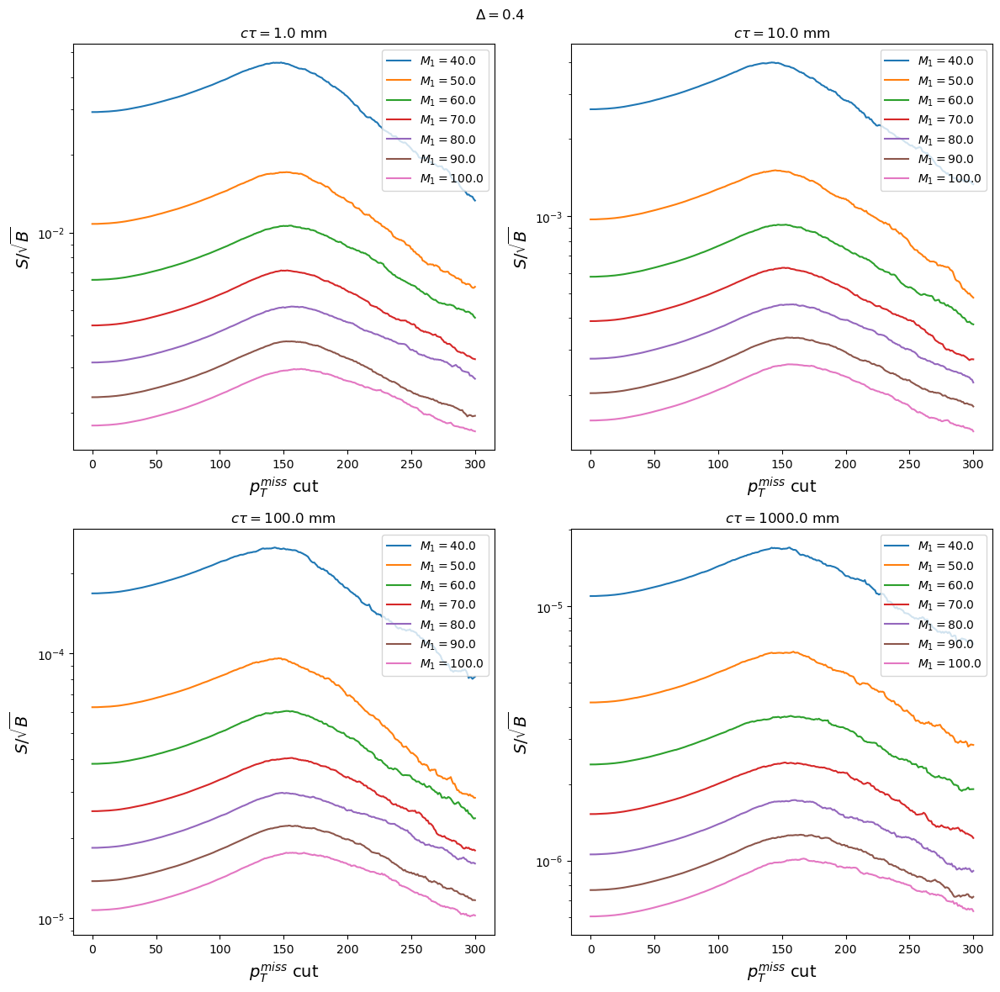

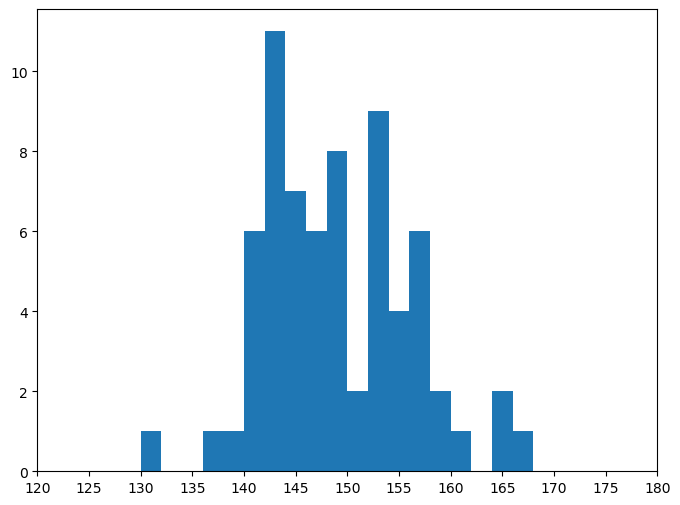

In [20]:
# N-1 for the MET cut
cut = "cut3"
hname = "MET_pt"
qcd_samples = [s for s in qcd_samples if ptools.getHTlow(s)>=200]
hb = qcd[hname][qcd_samples,cut,:]
hb = hb[sum,:]
hb.plot1d(yerr=False)
plt.yscale('log')
hb.axes[-1].label = r"$p_T^{miss}$"
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            hs.axes[-1].label = r"$p_T^{miss}$"
            x,signif = ptools.makeNMinus1(hs,hb)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima,bins=np.arange(100,202,2))
plt.xlim([120,180])
ticks = plt.xticks(np.arange(120,185,5))

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:21: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:21: RuntimeWarning: divide by zero encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


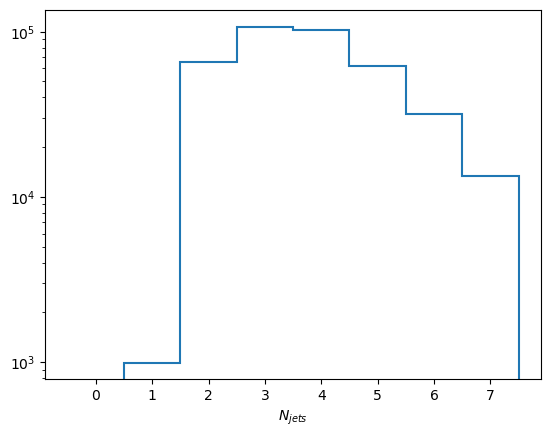

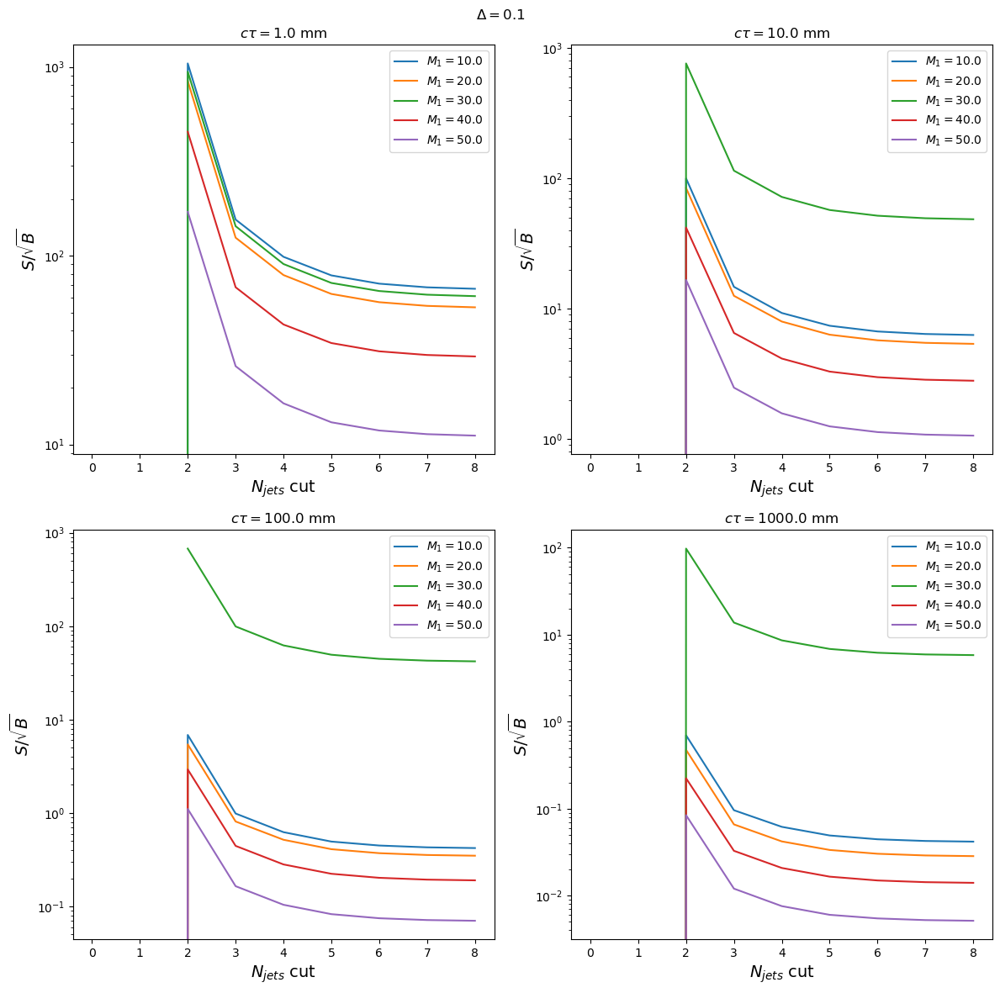

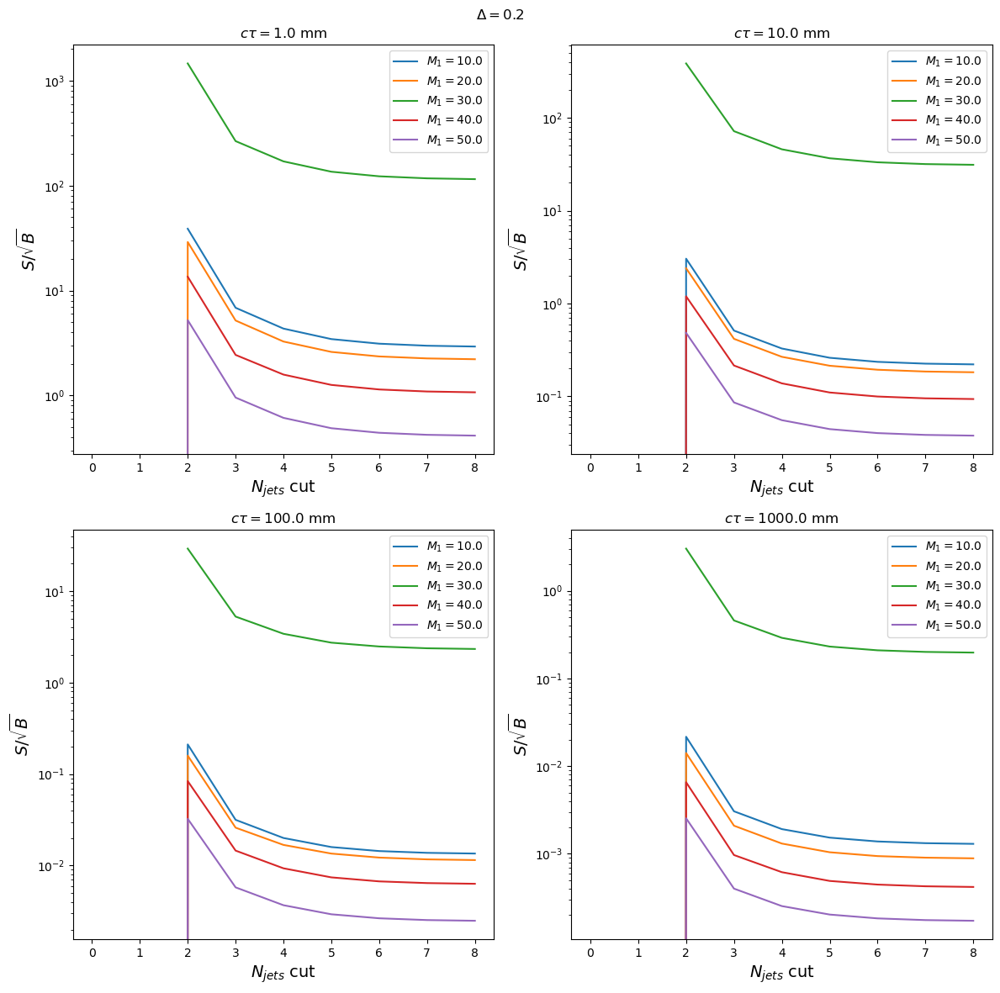

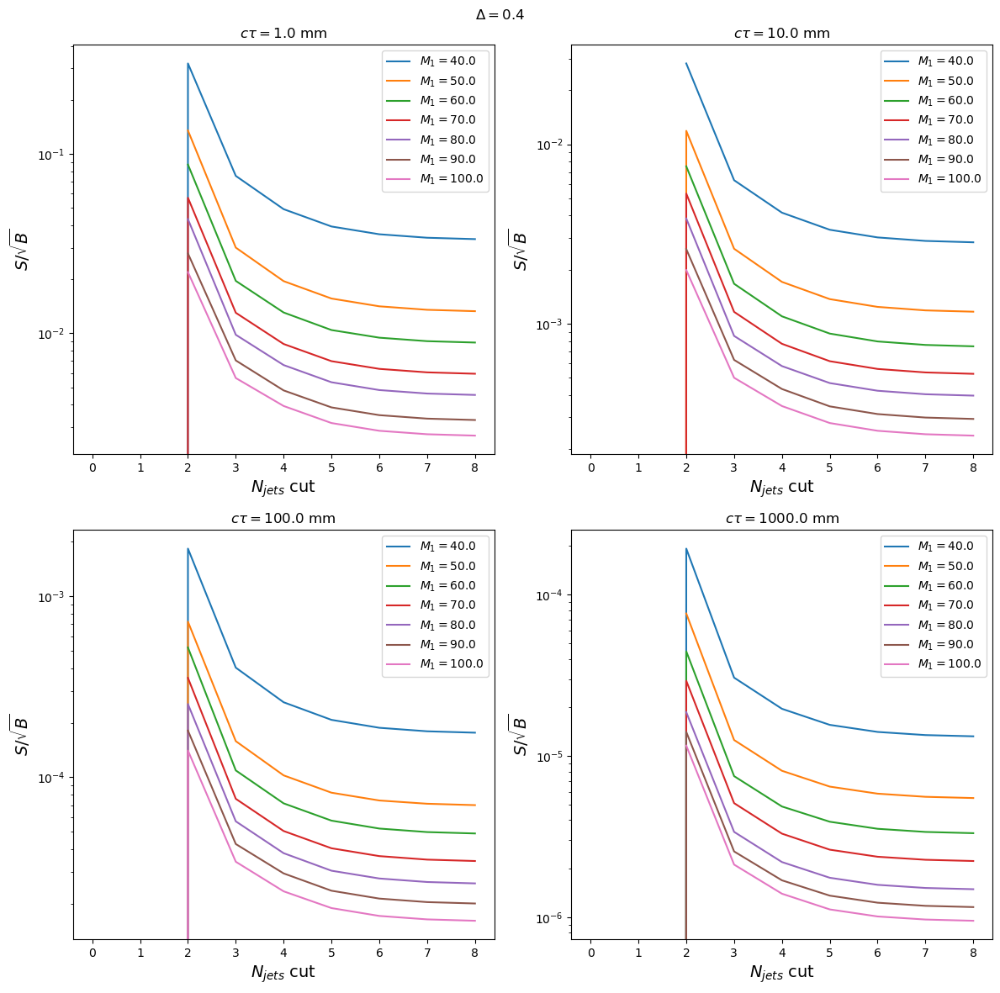

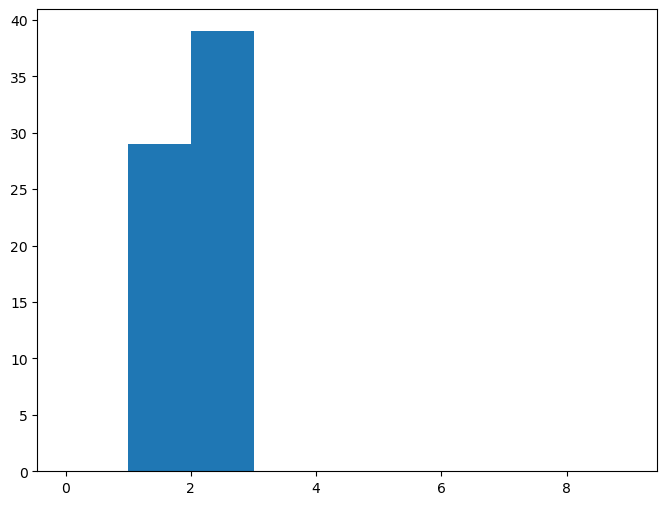

In [21]:
# N-1 for the nJets cut
cut = "cut4"
hname = "nJets"
hb = qcd[hname][sum,cut,:]
hb.plot1d(yerr=False)
plt.yscale('log')
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=True)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima,bins=np.arange(10))

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:21: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


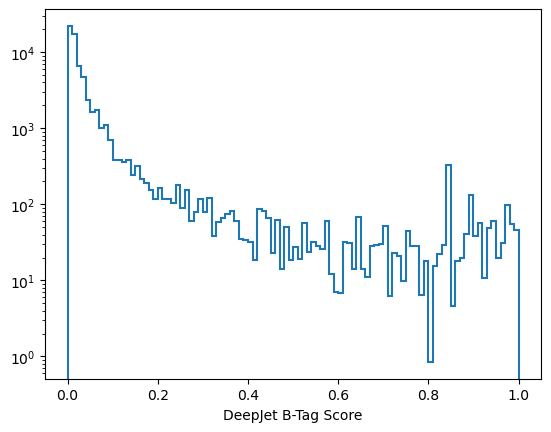

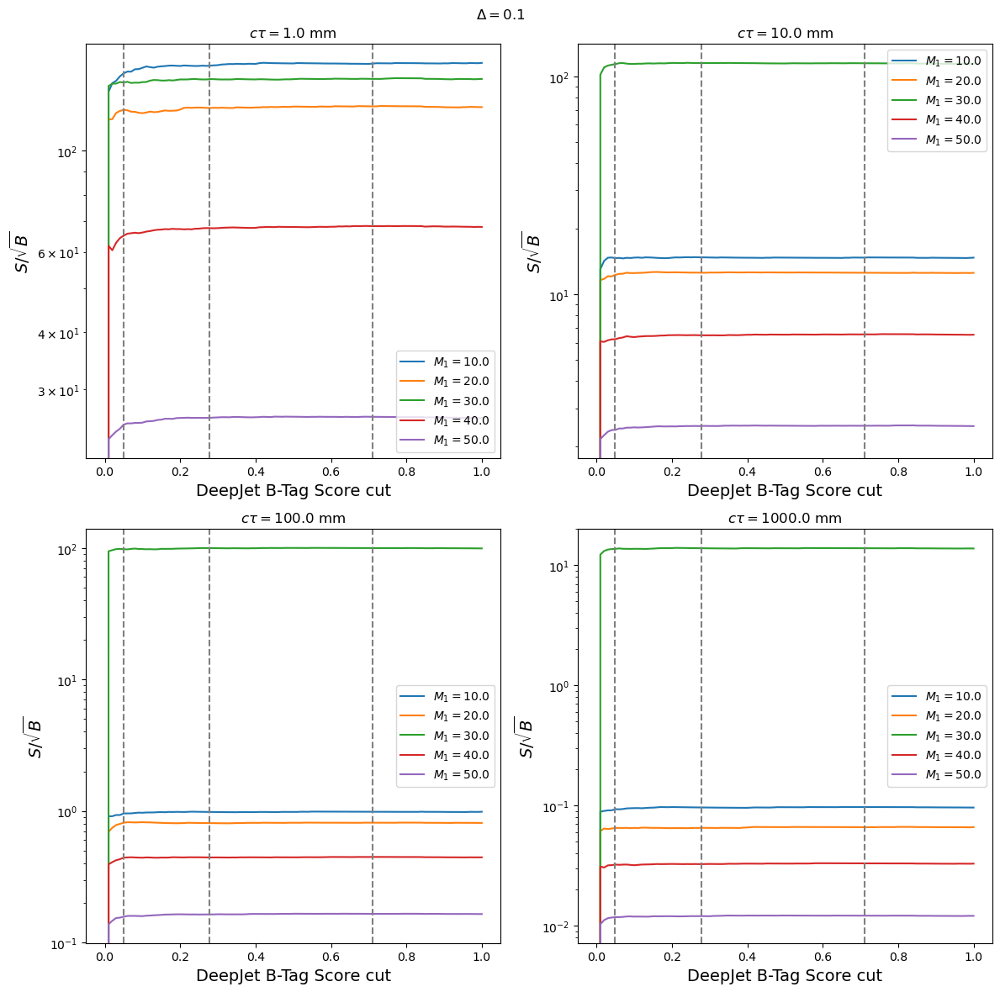

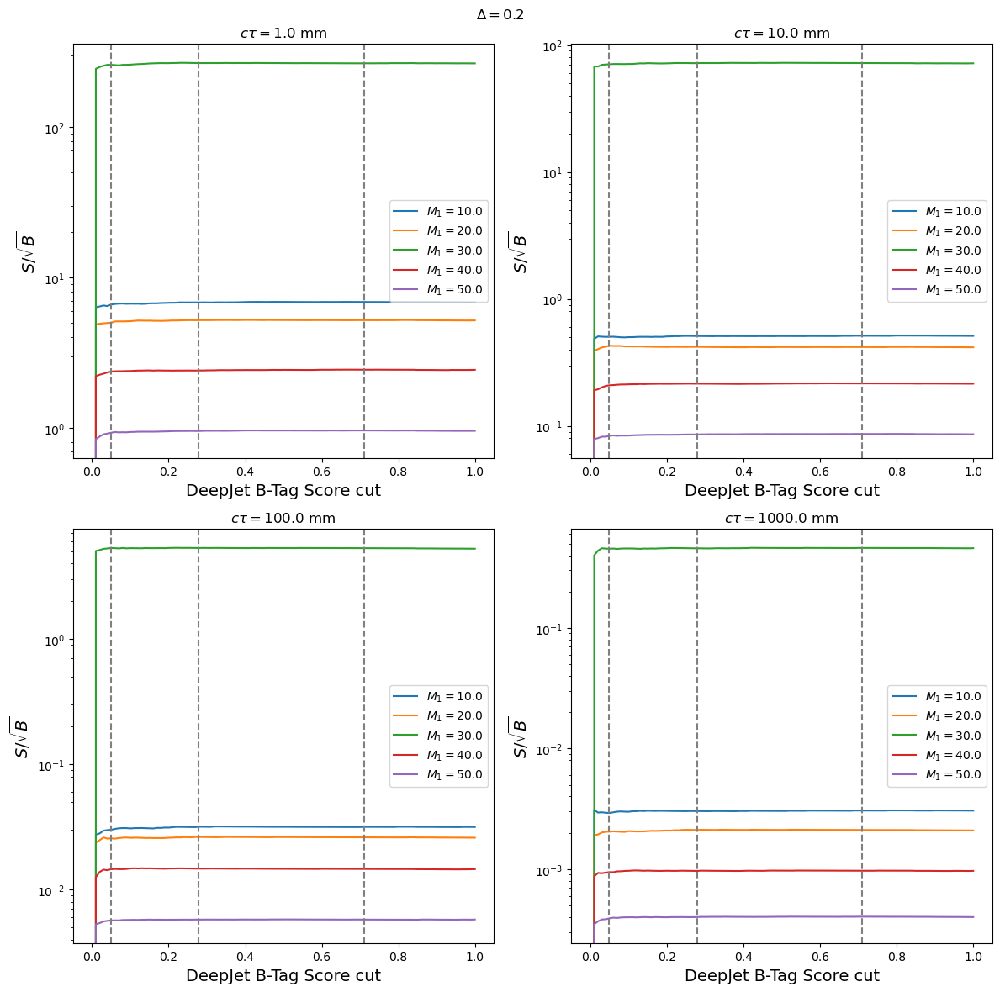

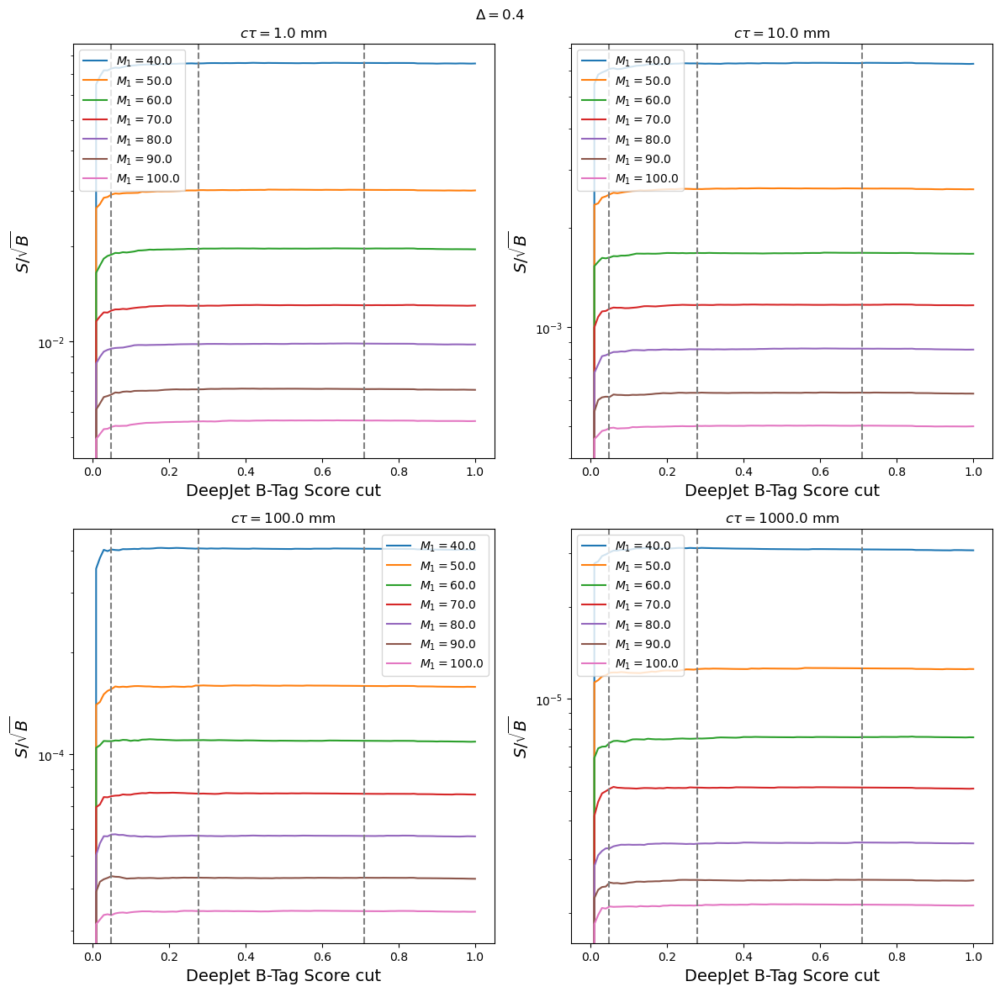

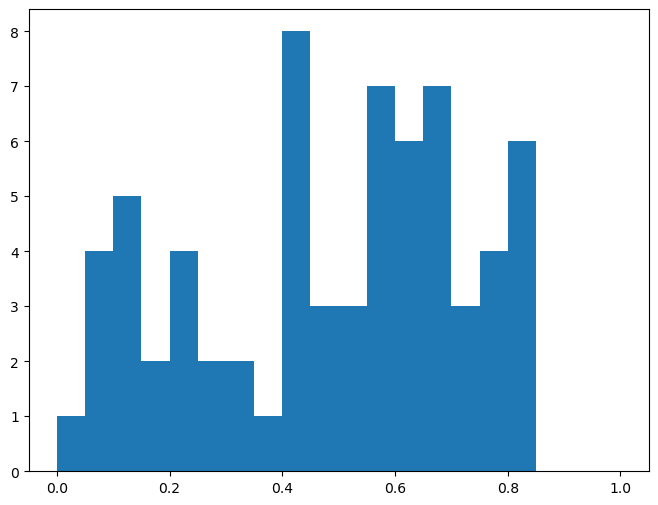

In [22]:
# N-1 for the bTag cut
cut = "cut5"
hname = "minBtag"
hb = qcd[hname][sum,cut,:]
hb.plot1d(yerr=False)
plt.yscale('log')
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=True)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.axvline(0.0490,linestyle='--',color='gray')
        plt.axvline(0.2783,linestyle='--',color='gray')
        plt.axvline(0.71,linestyle='--',color='gray')
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima,bins=np.arange(0,1.05,0.05))

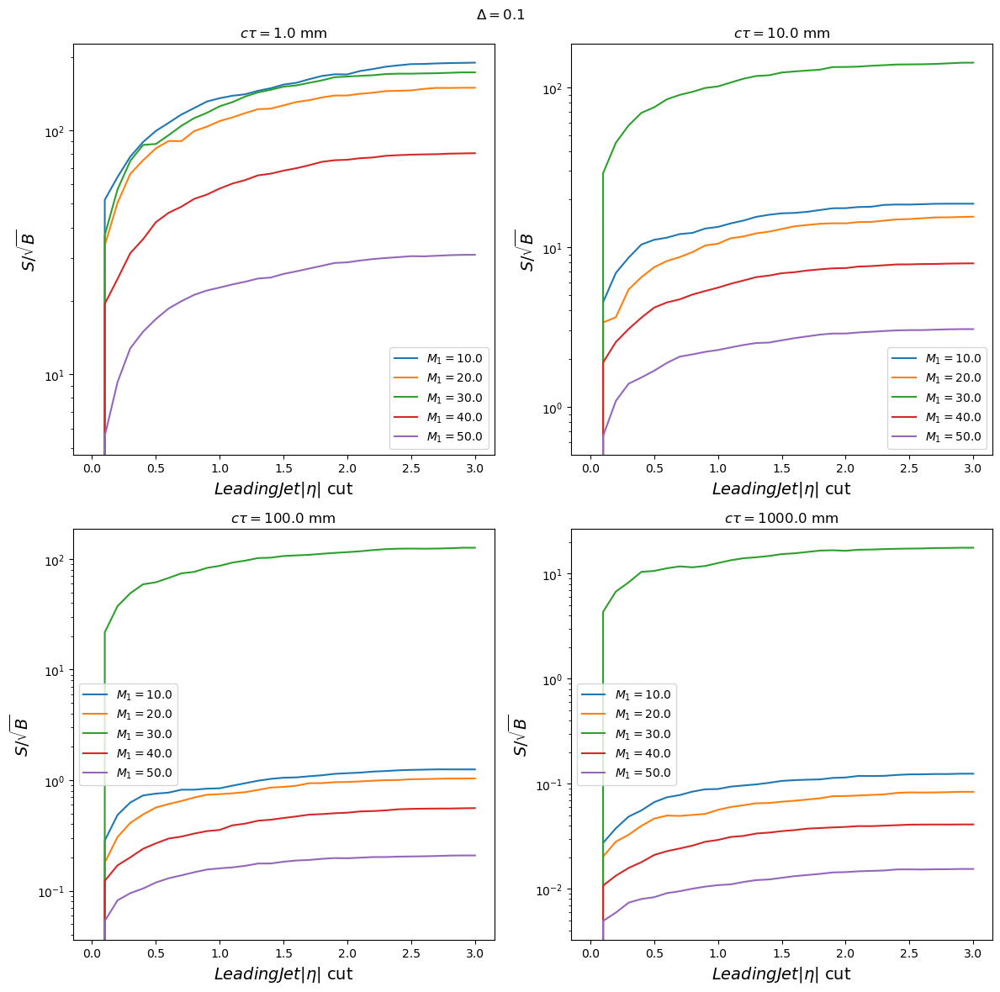

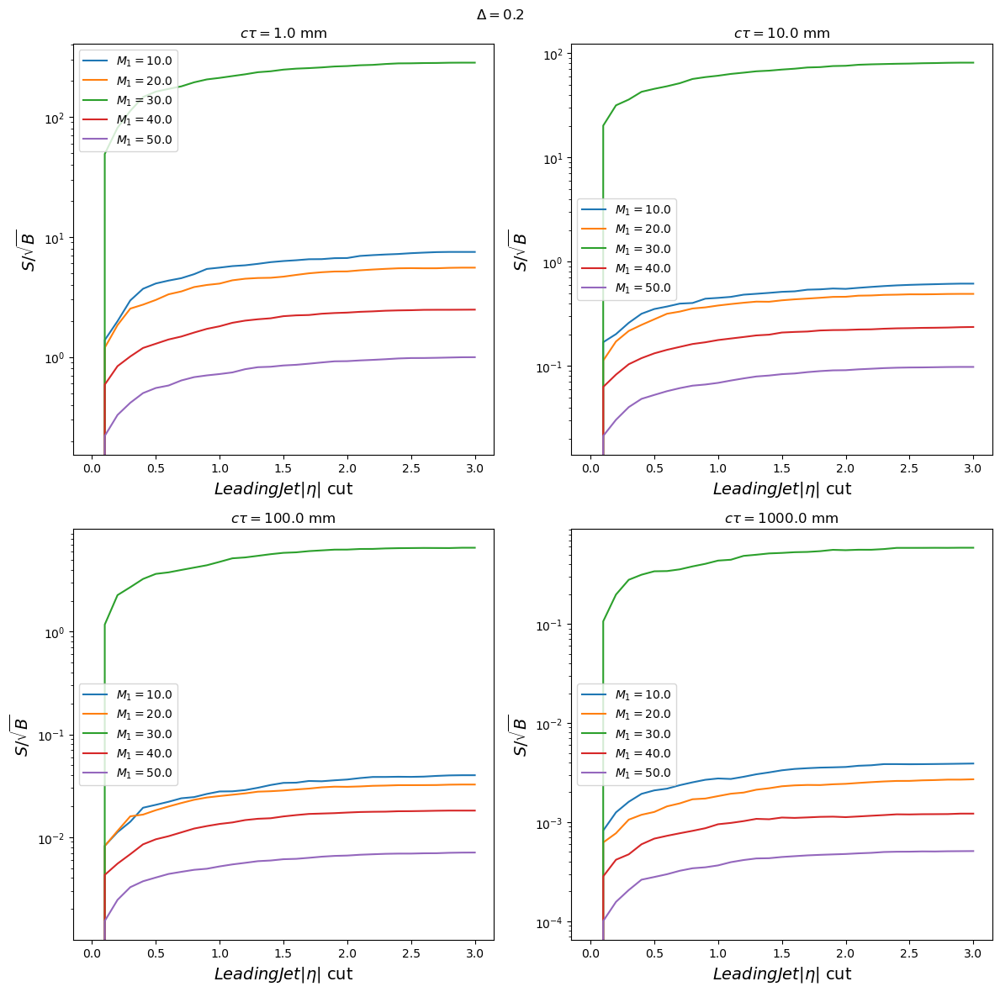

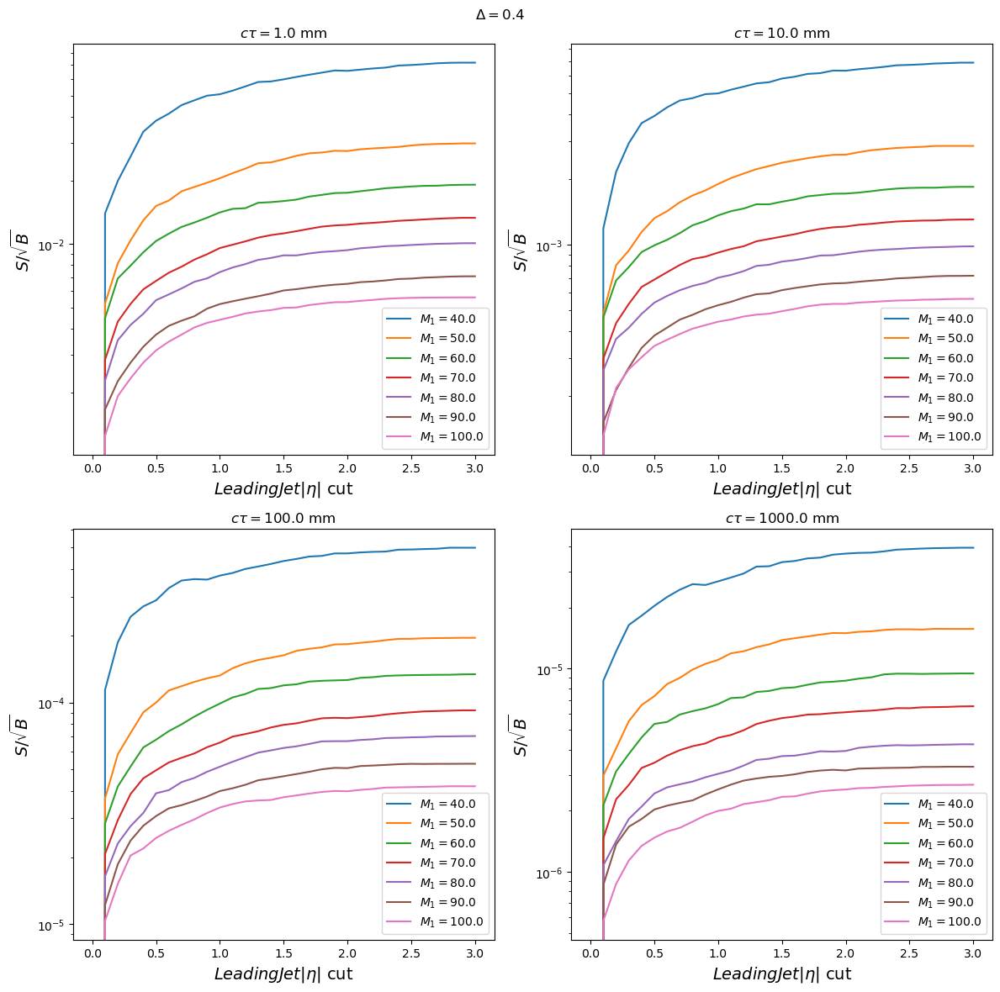

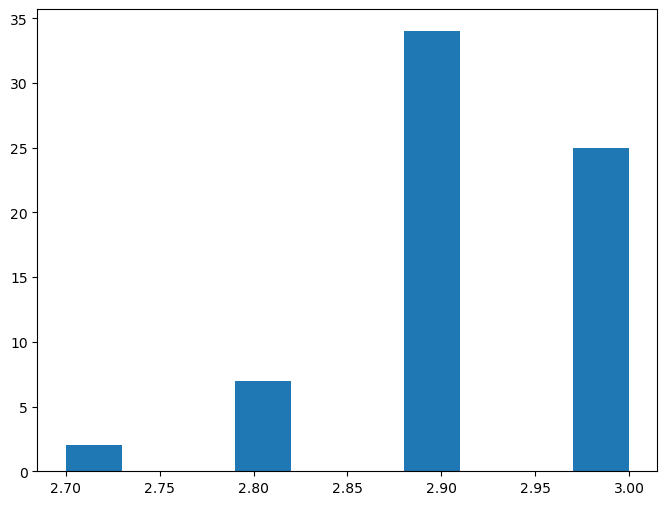

In [9]:
# N-1 for the leading jet eta cut
cut = "cut6"
hname = "lead_jet_abseta"
hb = qcd[hname][sum,cut,:]
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=True)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima)

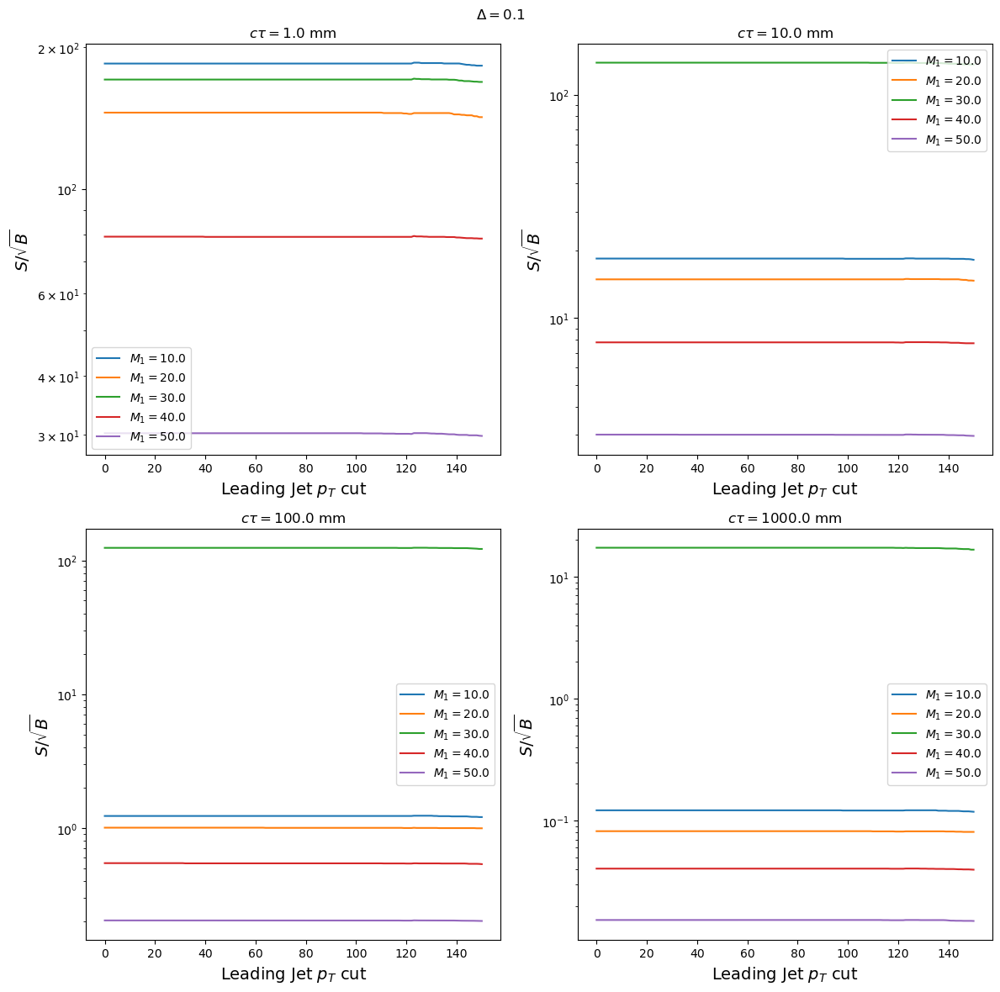

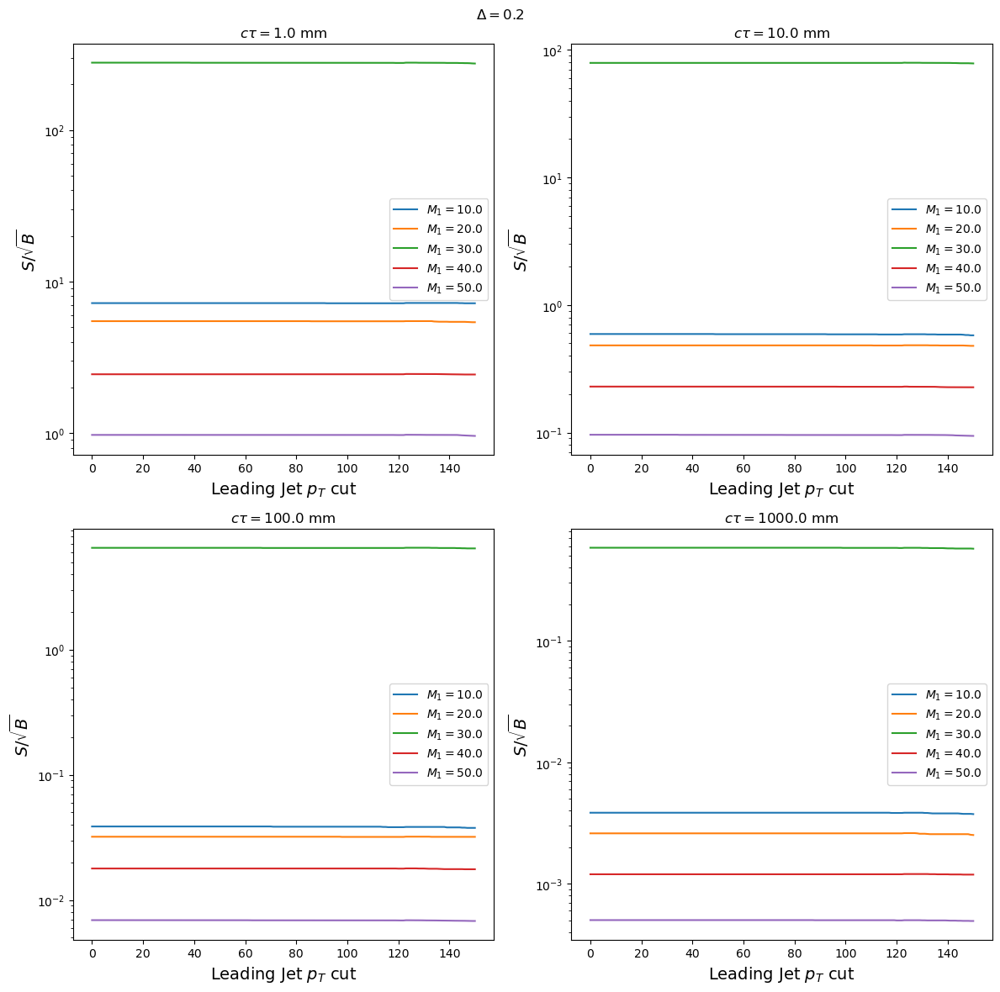

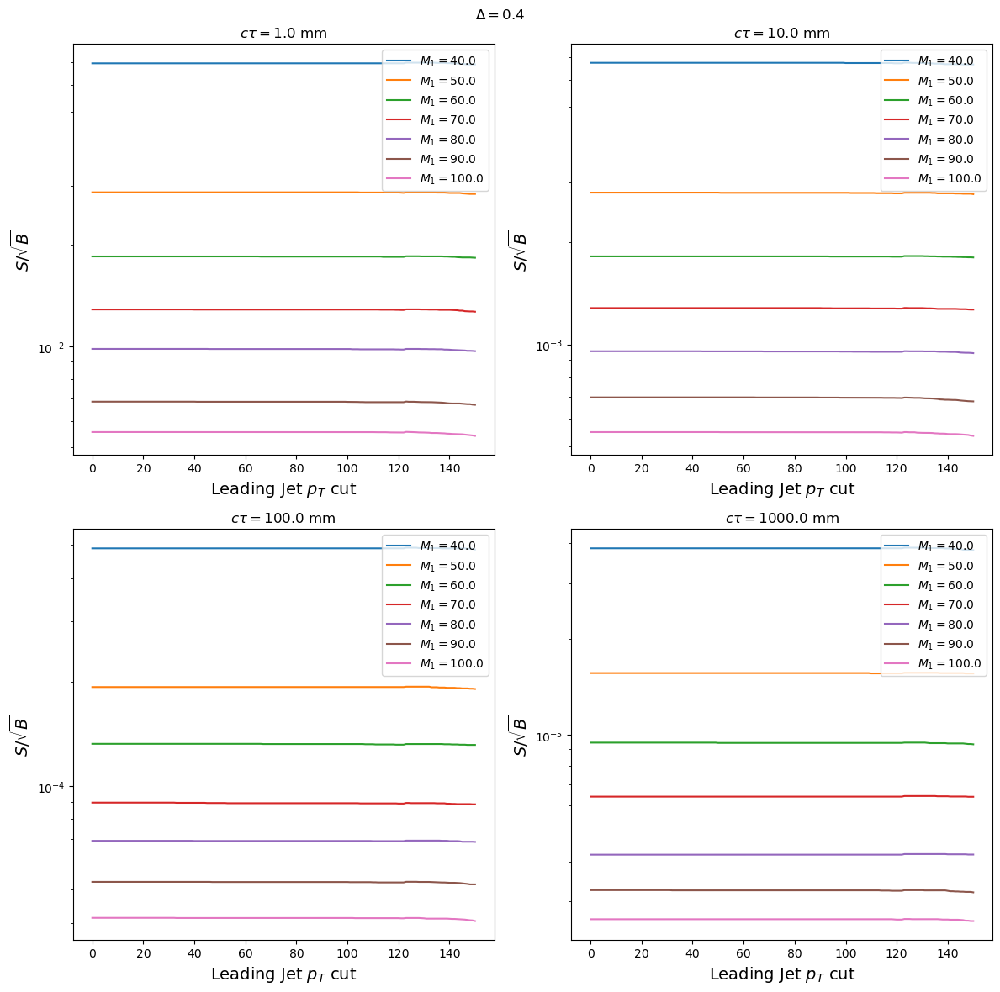

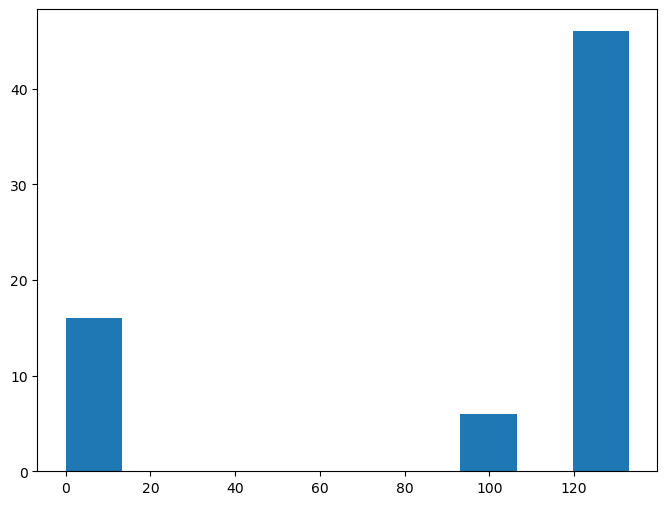

In [10]:
# N-1 for the leading jet pt cut
cut = "cut7"
hname = "lead_jet_pt"
hb = qcd[hname][sum,cut,:]
hb.plot1d(yerr=False)
plt.yscale('log')
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=False)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima)

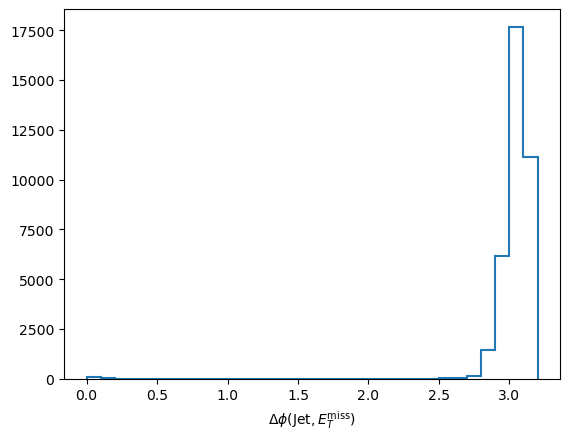

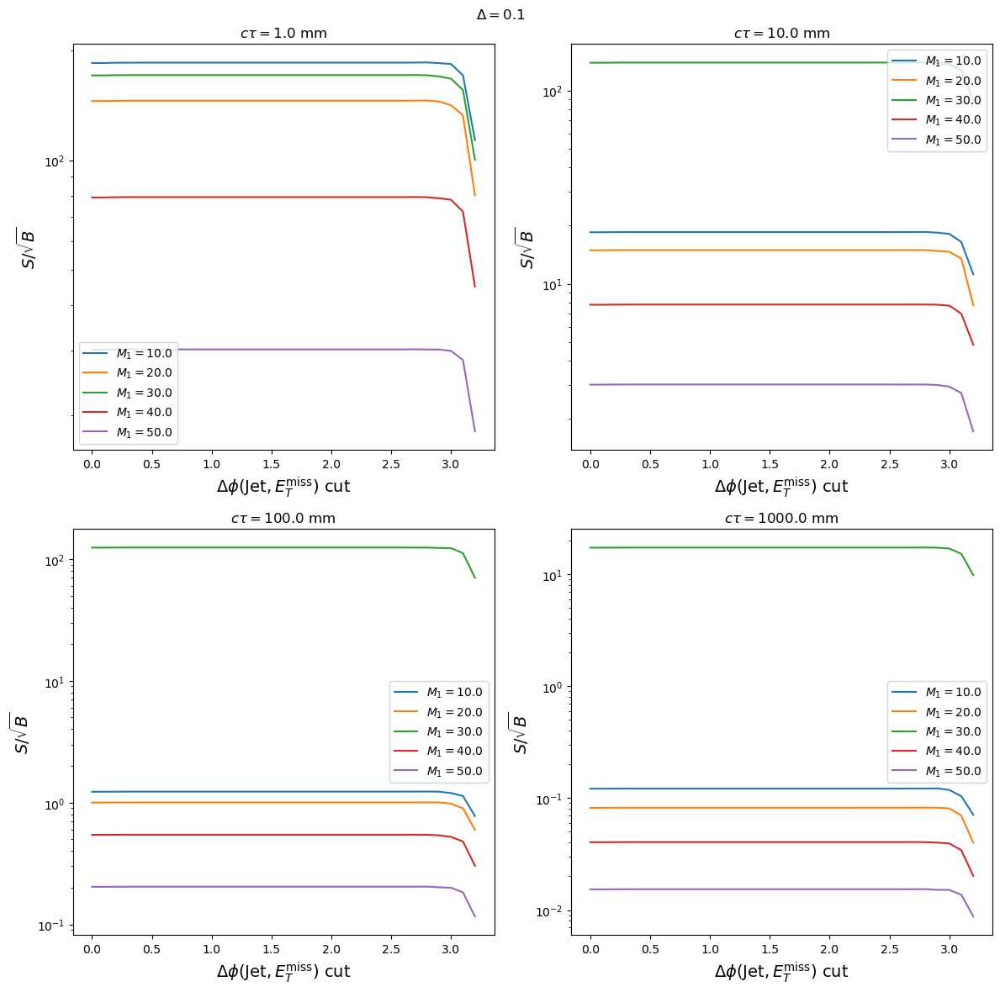

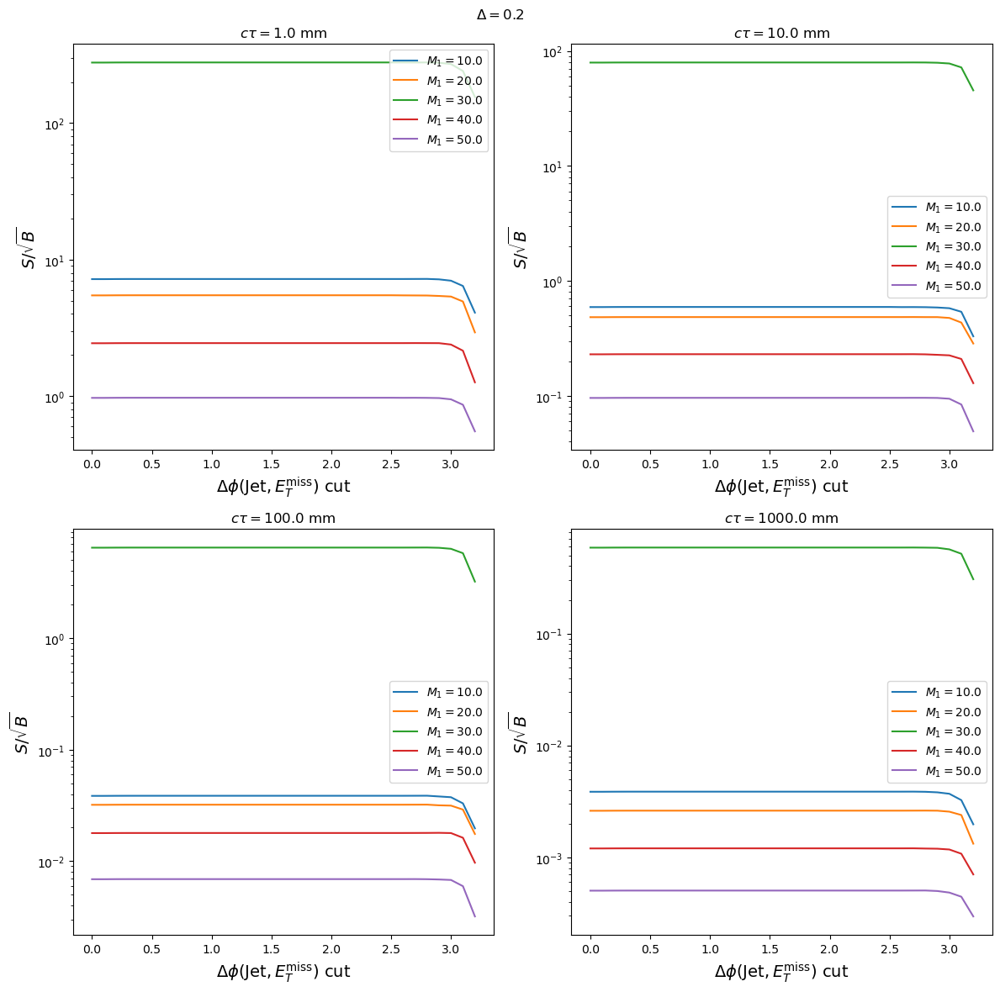

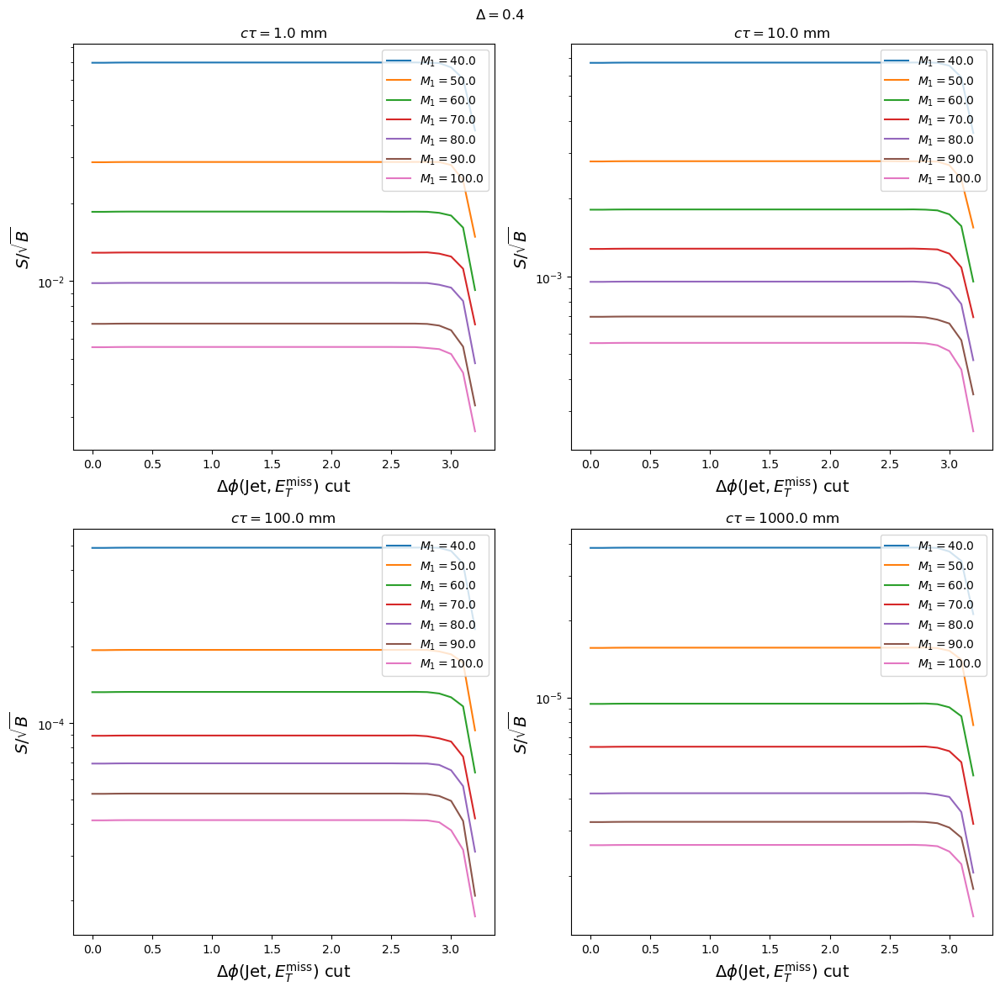

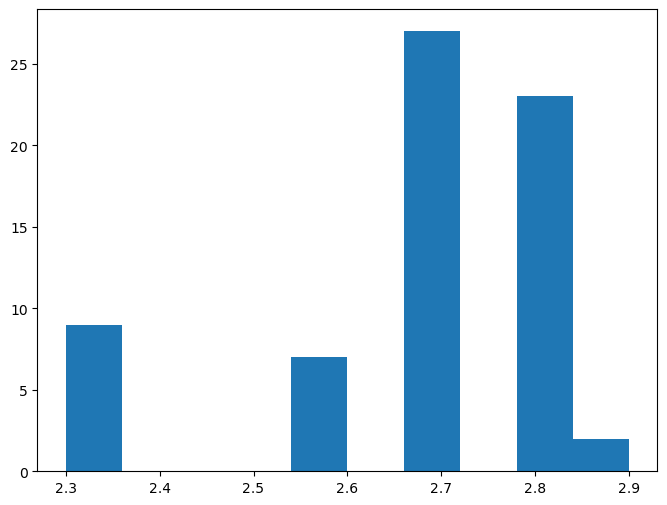

In [23]:
# N-1 for the MET-Jet dPhi
cut = "cut8"
hname = "lead_jet_met_dPhi"
hb = qcd[hname][sum,cut,:]
hb.plot1d(yerr=False)
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=False)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima)

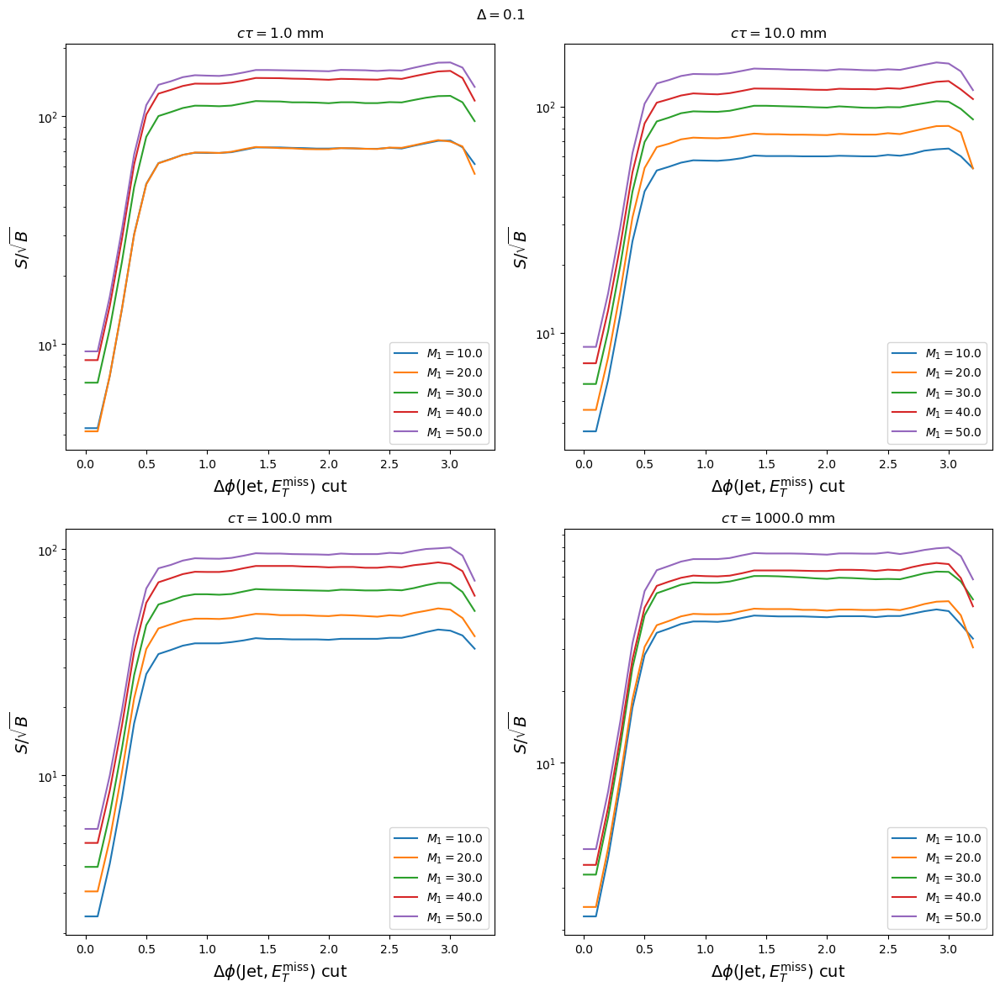

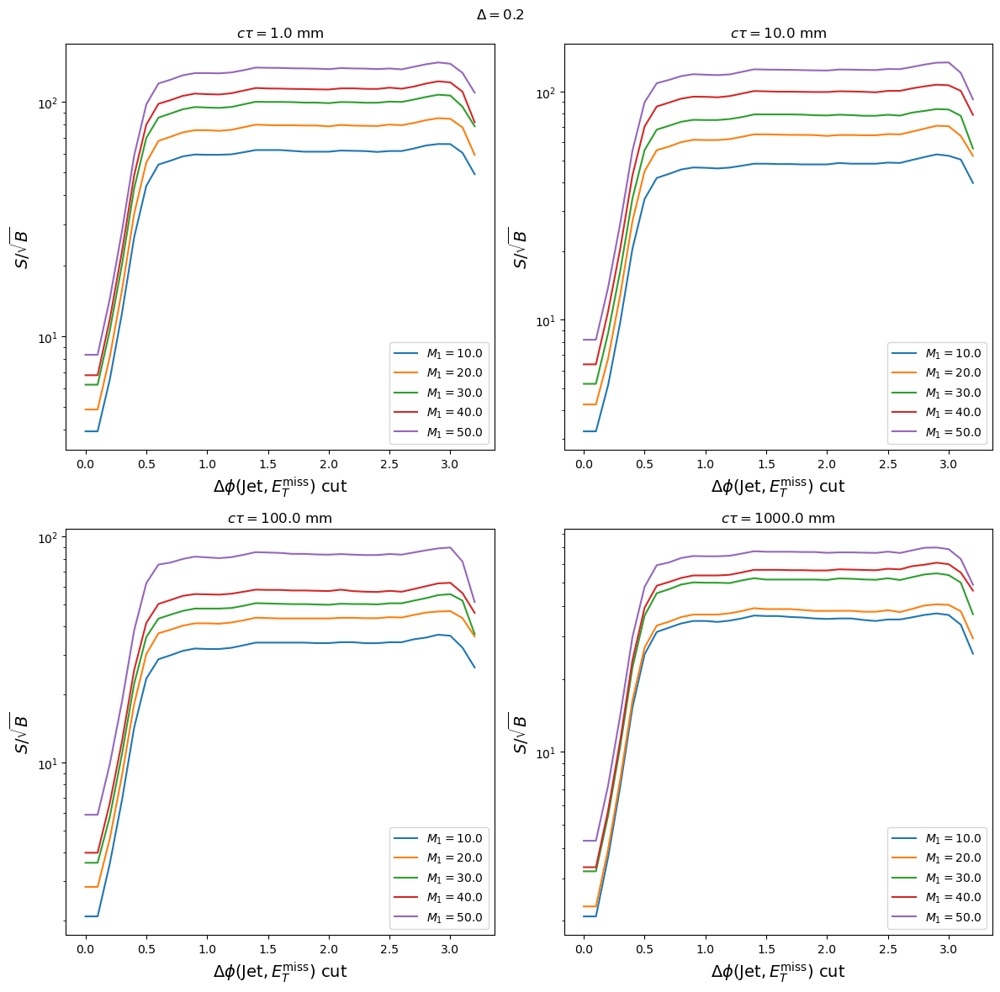

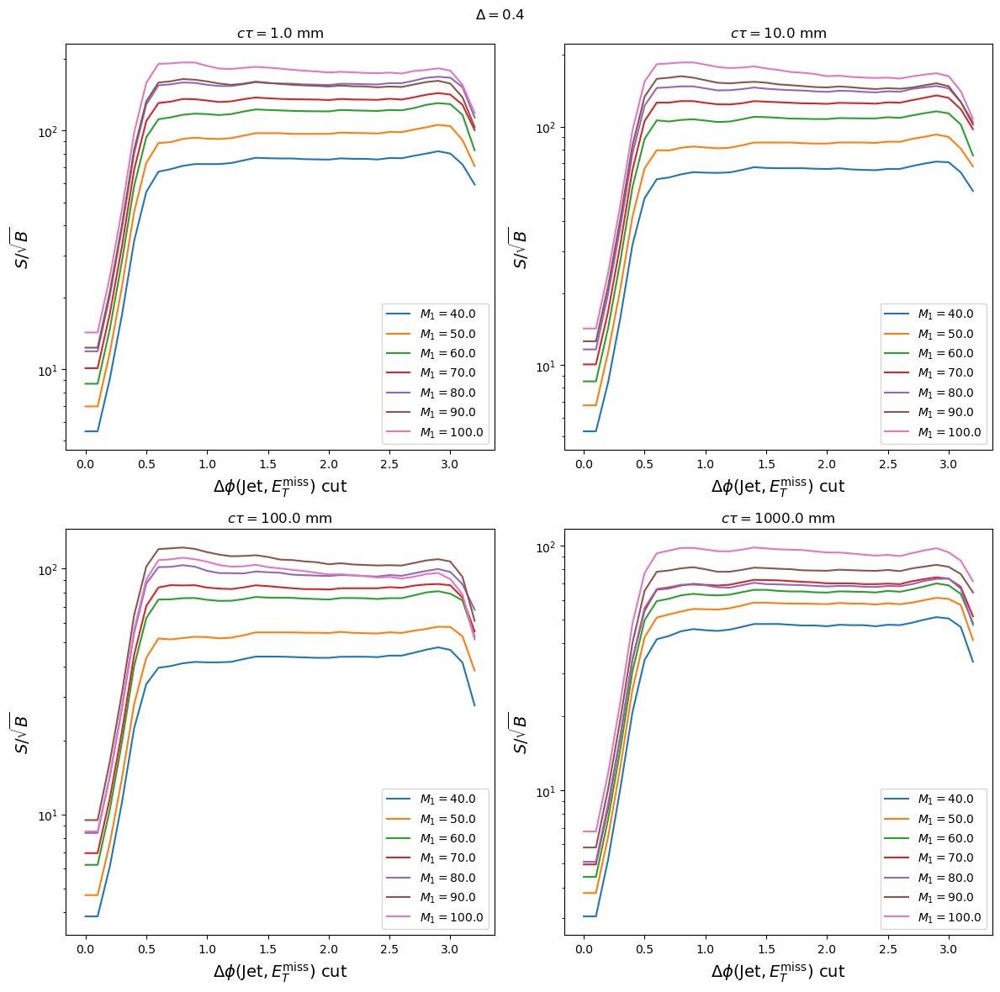

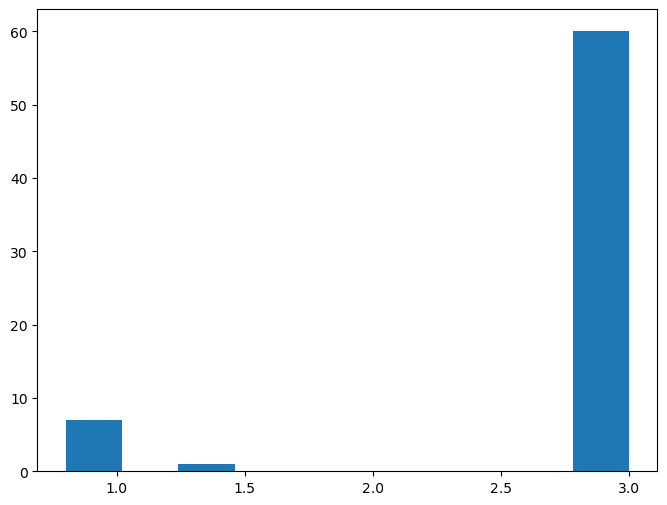

In [12]:
# N-1 for the MET-allJet dPhi
cut = "cut9"
hname = "min_jet_met_dPhi"
hb = qcd[hname][sum,cut,:]
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=False)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima)

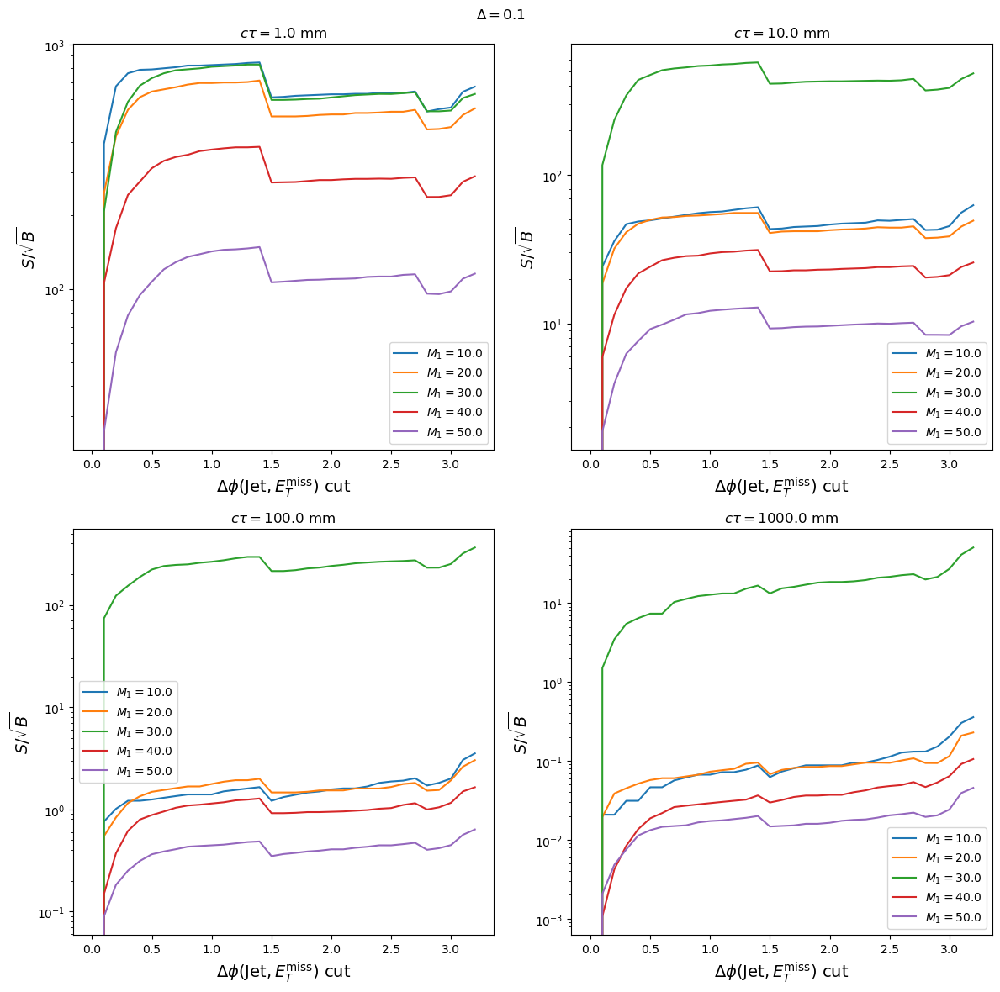

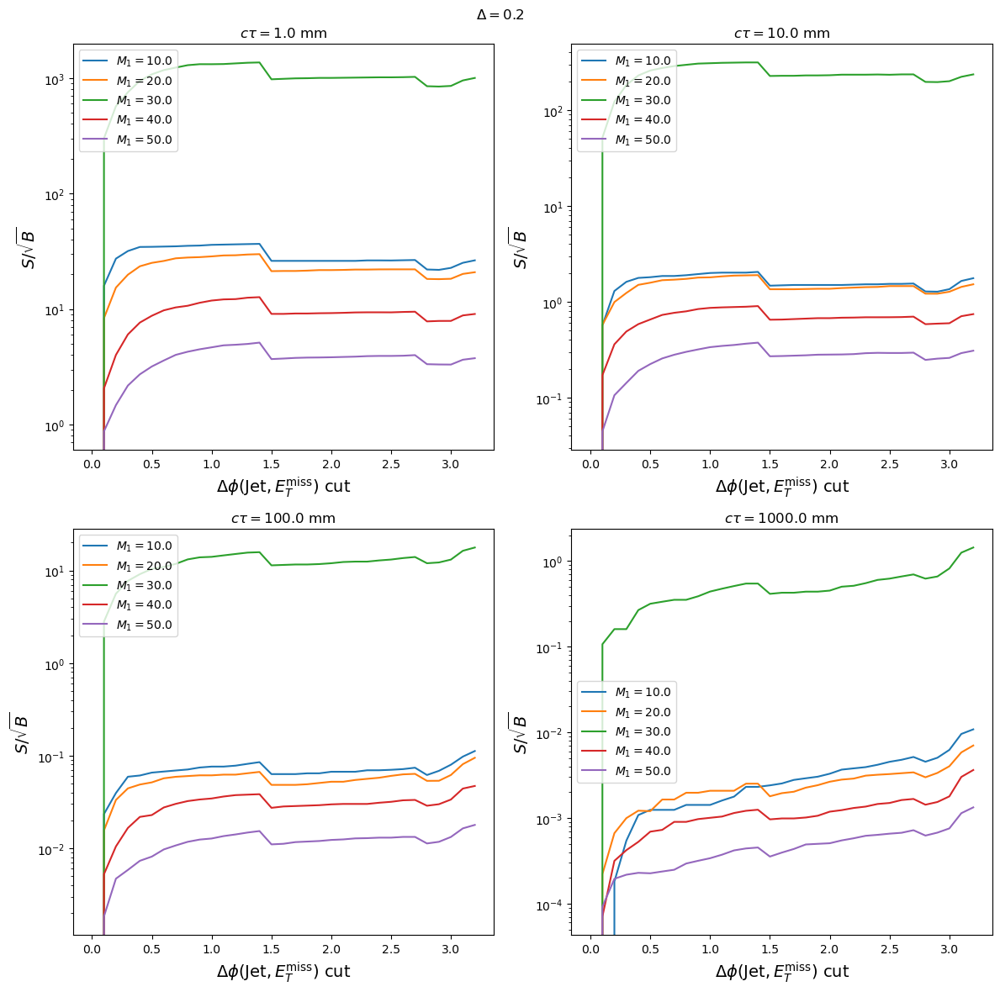

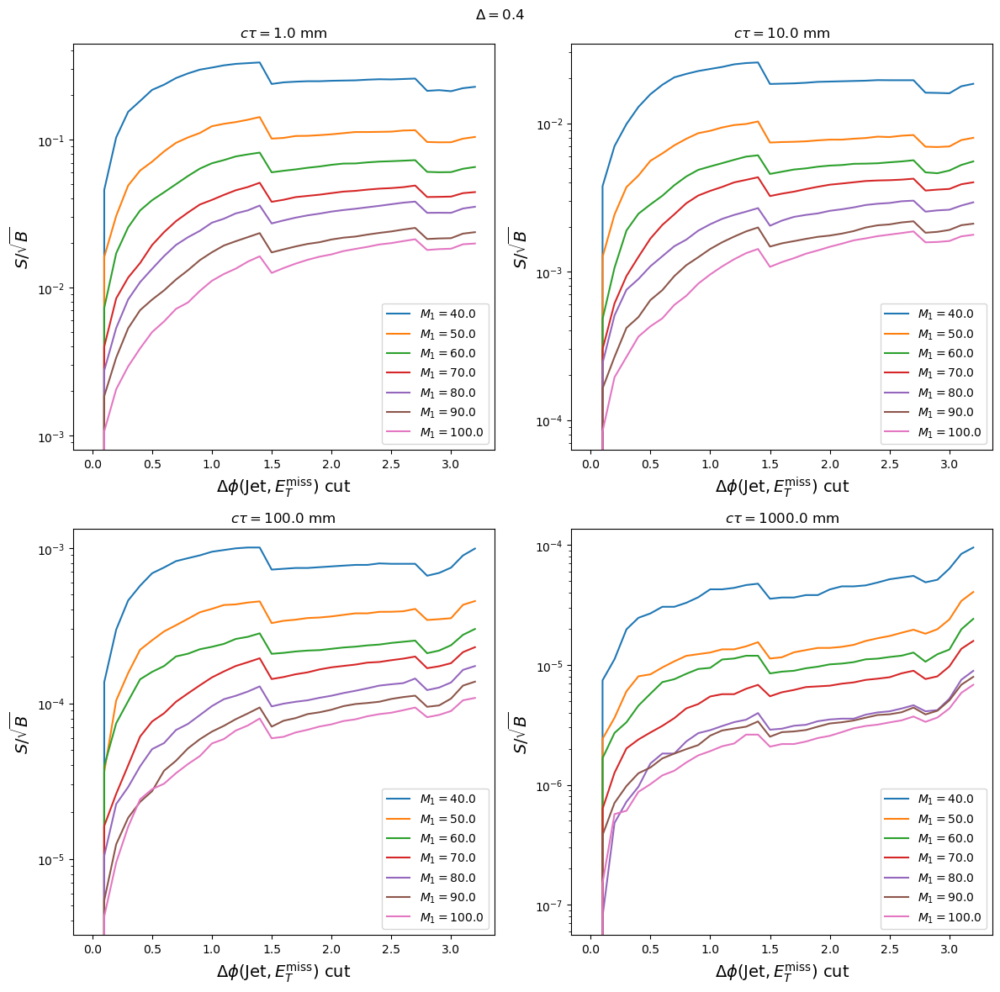

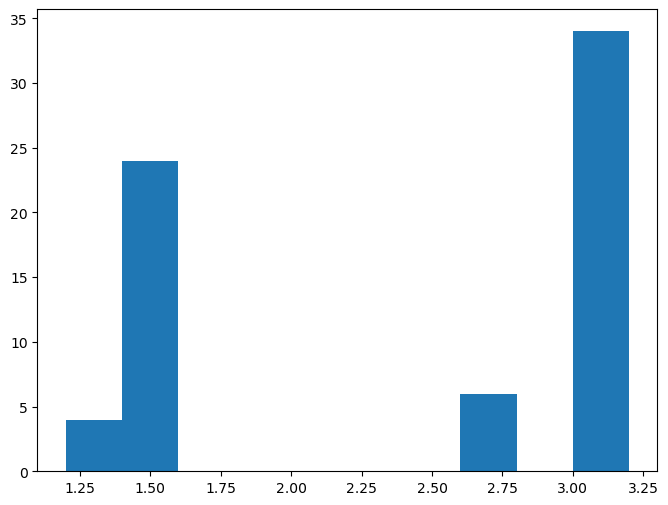

In [13]:
# N-1 for the MET-vtx dPhi
cut = "cut11"
hname = "vtx_met_dPhi"
hb = qcd[hname][sum,cut,:]
varAx = hb.axes[-1]
optima = []
for delta in deltas:
    plt.figure(figsize=(12,12))
    m1s = sorted(list(set(si[si.delta==delta].m1)))
    for i,ct in enumerate(ctaus):
        plt.subplot(2,2,i+1)
        plt.title(r"$c\tau = {0}$ mm".format(ct))
        for m1 in m1s:
            point = si[(si.delta==delta) & (si.m1==m1) & (si.ctau==ct)].name[0]
            hs = sig[hname][point,cut,:]
            x,signif = ptools.makeNMinus1(hs,hb,lessThan=True)
            plt.plot(x,signif,label=r"$M_1 = {0}$".format(m1))
            optima.append(x[np.argmax(signif)])
        plt.xlabel(f"{varAx.label} cut",fontsize=14)
        plt.ylabel(r"$S/\sqrt{B}$",fontsize=14)
        plt.yscale('log')
        plt.legend(loc='best')
    plt.suptitle(r"$\Delta = {0:.1f}$".format(delta))
    plt.tight_layout()
plt.figure(figsize=(8,6))
h = plt.hist(optima)

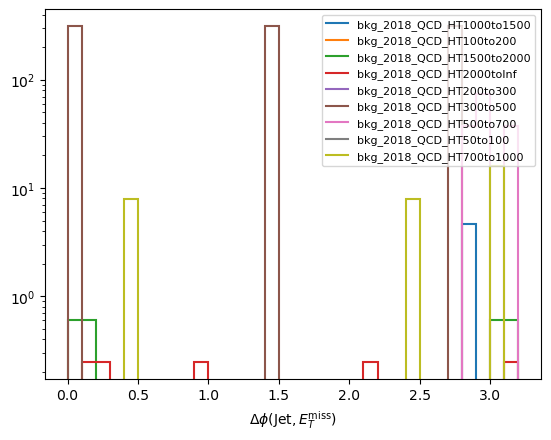

In [17]:
hb = qcd[hname][:,cut,:]
hb.plot1d(overlay='samp',yerr=False)
plt.yscale('log')
plt.legend(loc='best',fontsize=8)

# Electron Isolation

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


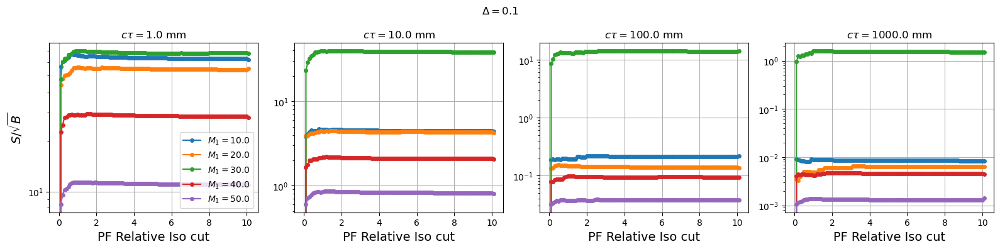

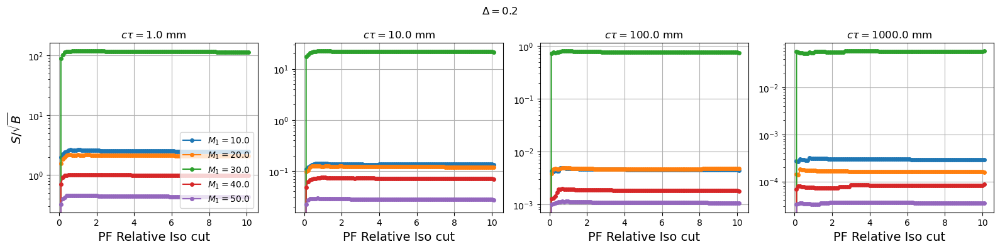

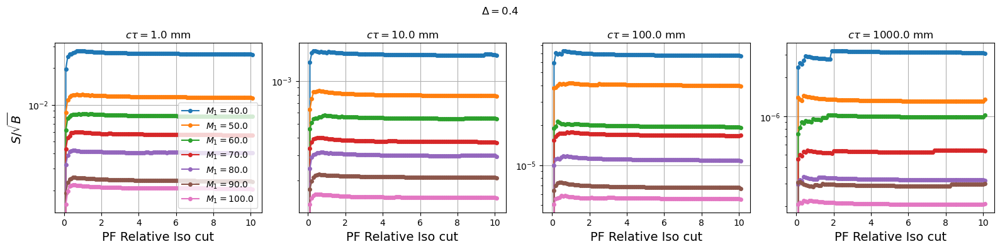

<Figure size 800x600 with 0 Axes>

In [35]:
# N-1 for the e1_PFRelIso
hname = "sel_e1_PFRelIso"
plotNminus1(hname,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


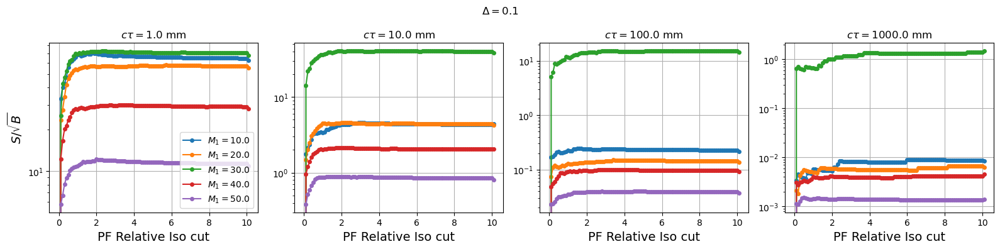

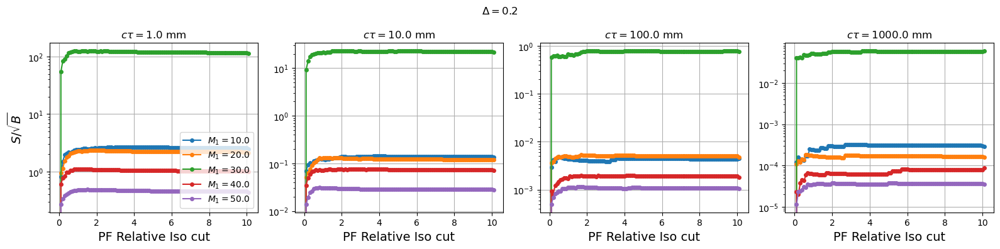

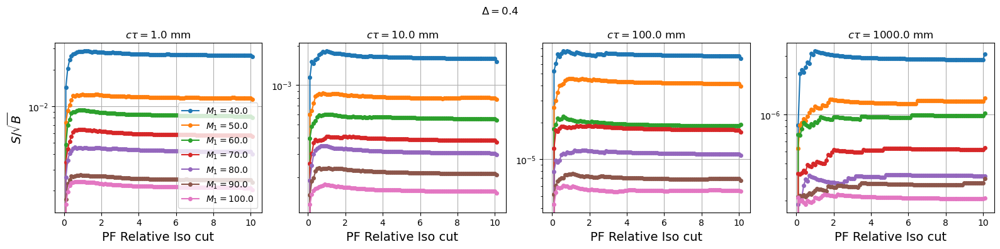

<Figure size 800x600 with 0 Axes>

In [36]:
# N-1 for the e2_PFRelIso
hname = "sel_e2_PFRelIso"
plotNminus1(hname,logy=True,loc='lower right')

# Vertex Isolation

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


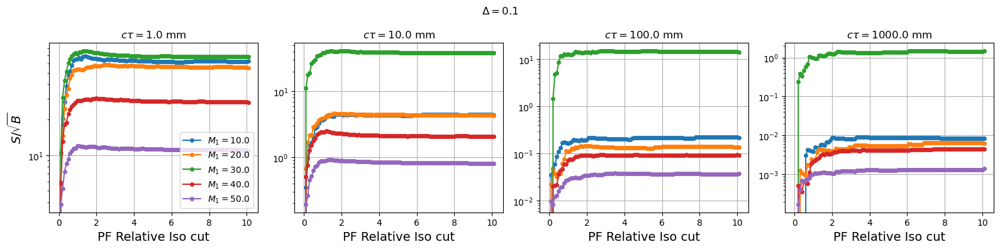

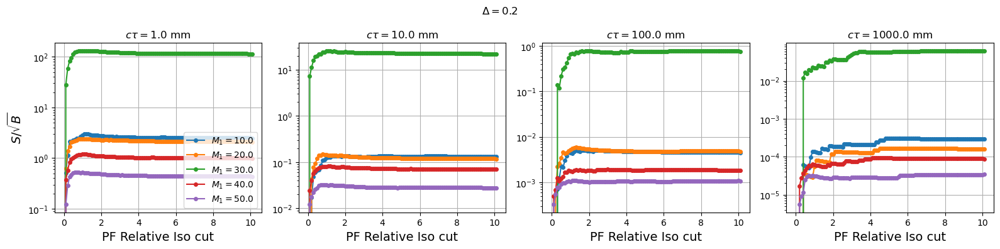

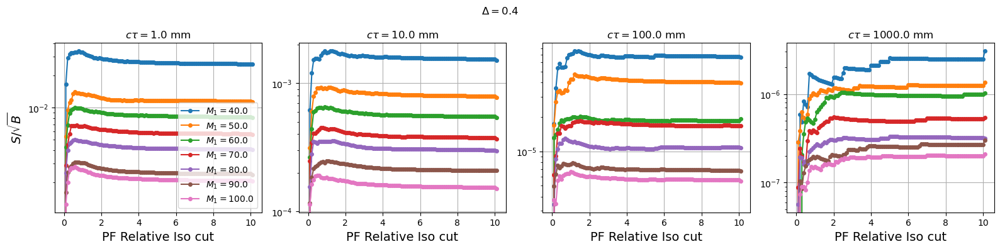

<Figure size 800x600 with 0 Axes>

In [8]:
# N-1 for the vtx_PFRelIso3
hname = "sel_vtx_PFRelIso3"
plotNminus1(hname,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


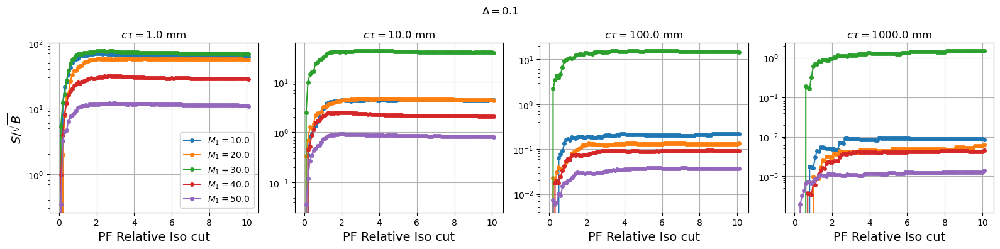

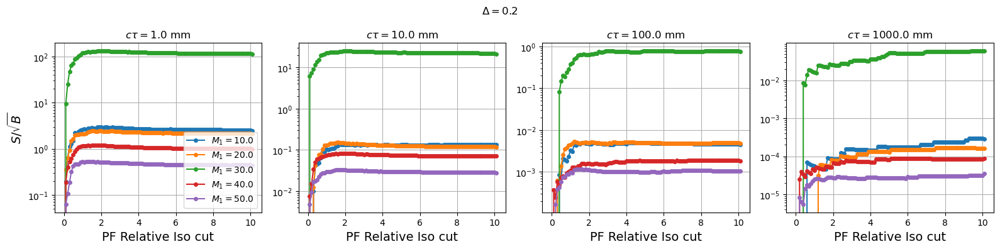

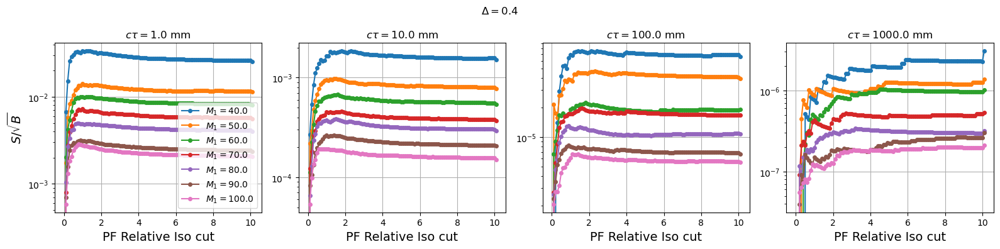

<Figure size 800x600 with 0 Axes>

In [9]:
# N-1 for the vtx_PFRelIso4
hname = "sel_vtx_PFRelIso4"
plotNminus1(hname,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


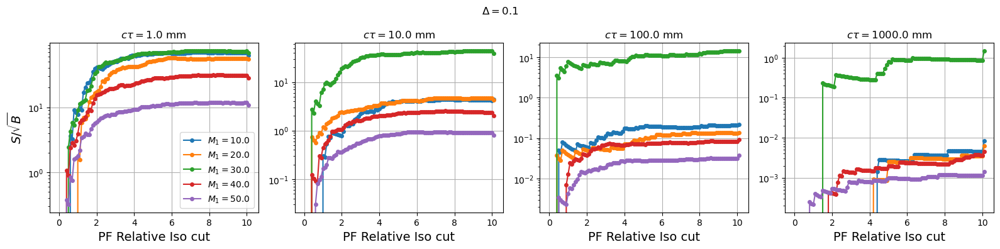

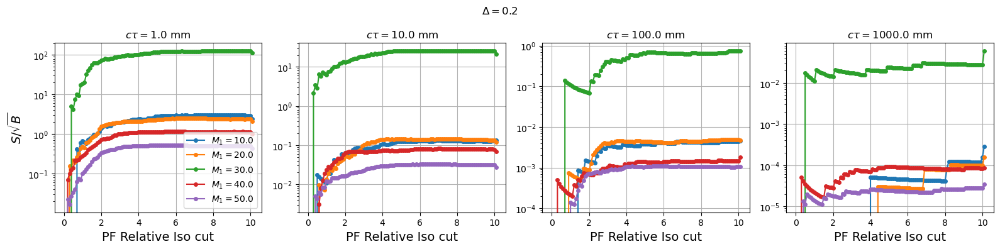

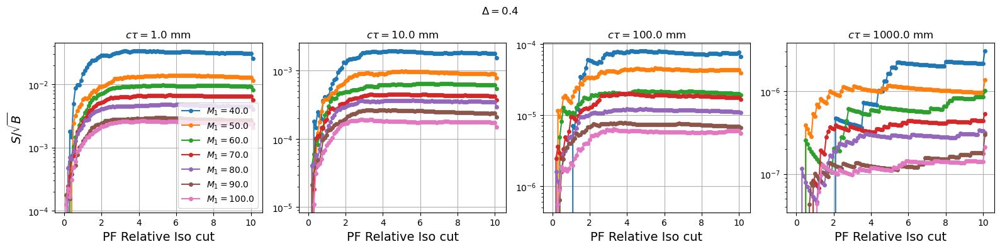

<Figure size 800x600 with 0 Axes>

In [10]:
# N-1 for the vtx_PFRelIso8
hname = "sel_vtx_PFRelIso8"
plotNminus1(hname,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


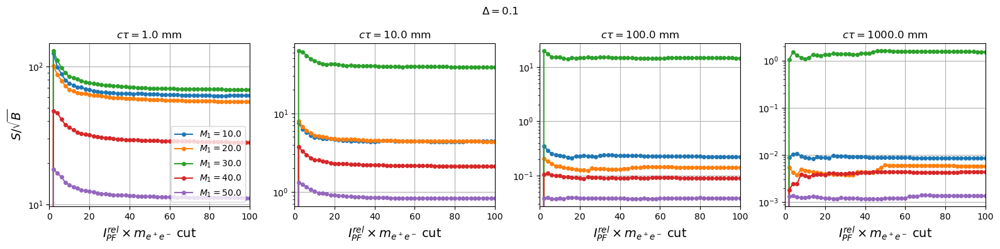

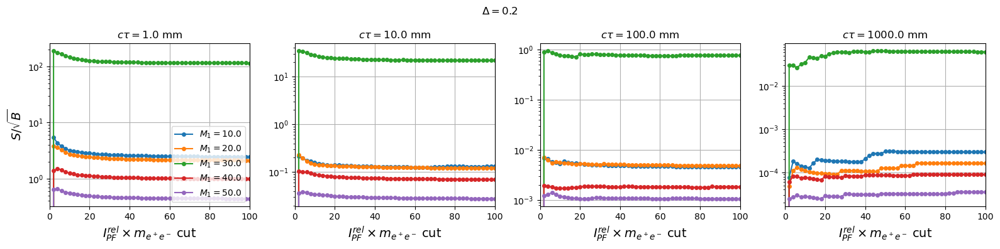

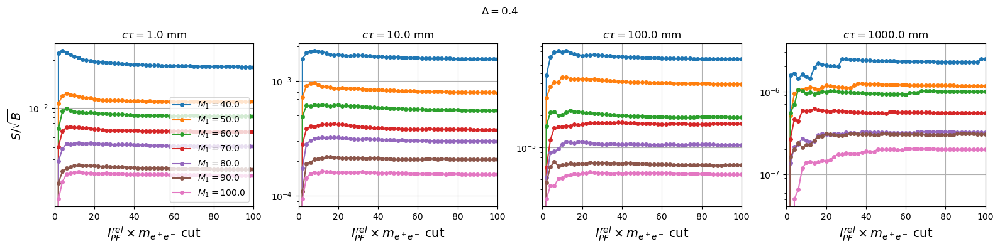

<Figure size 800x600 with 0 Axes>

In [11]:
# N-1 for the vtx_PFRelIso3 * mass
hname = "sel_vtx_PFRelIso3M"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


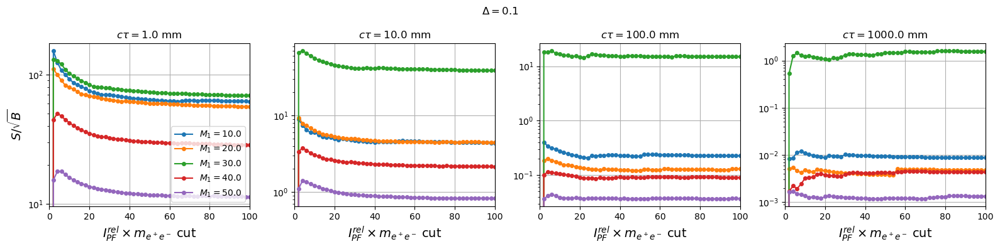

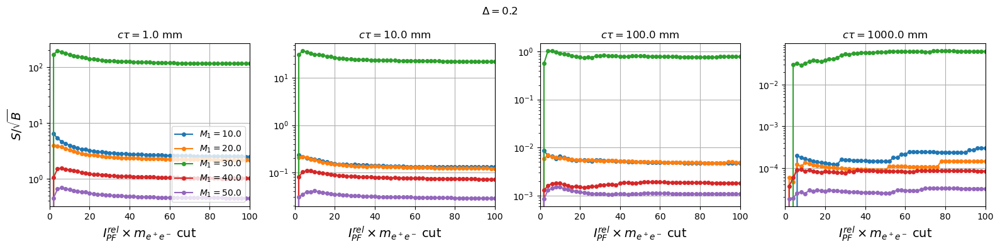

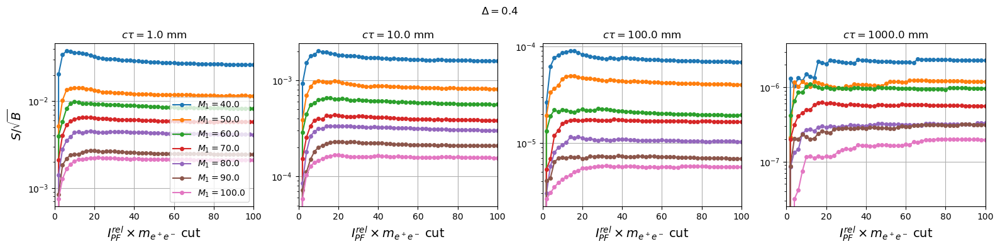

<Figure size 800x600 with 0 Axes>

In [12]:
# N-1 for the vtx_PFRelIso4 * mass
hname = "sel_vtx_PFRelIso4M"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


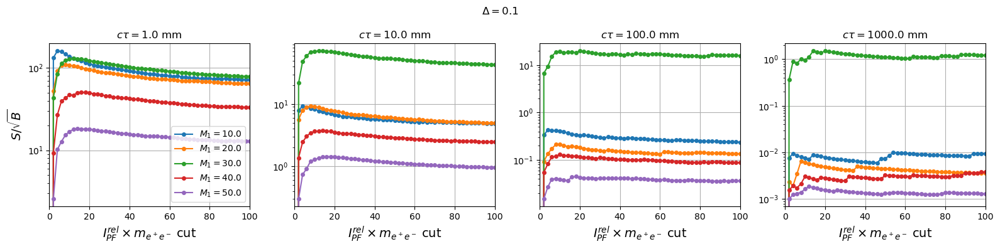

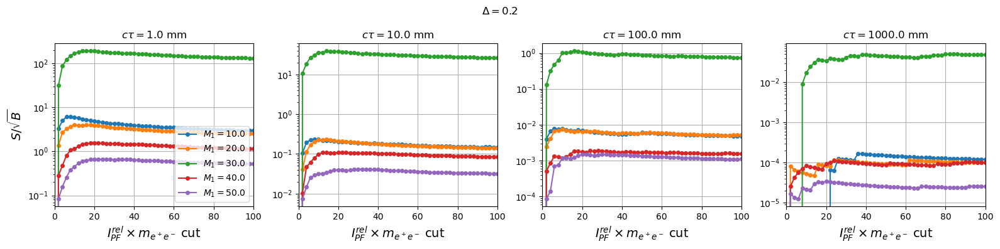

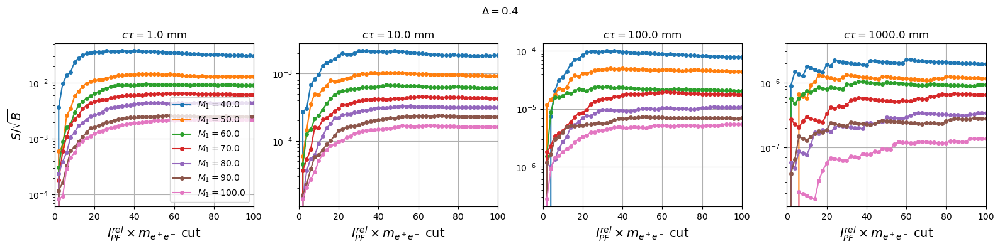

<Figure size 800x600 with 0 Axes>

In [13]:
# N-1 for the vtx_PFRelIso8 * mass
hname = "sel_vtx_PFRelIso8M"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


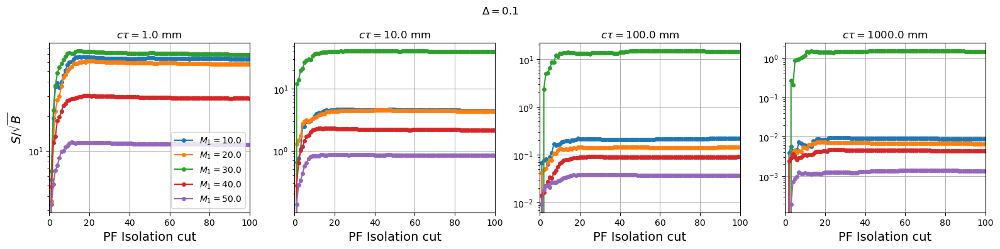

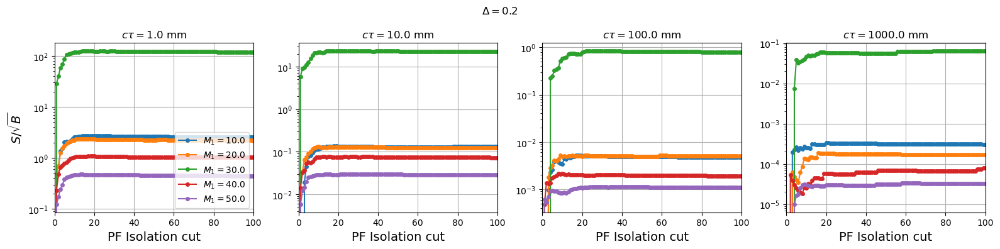

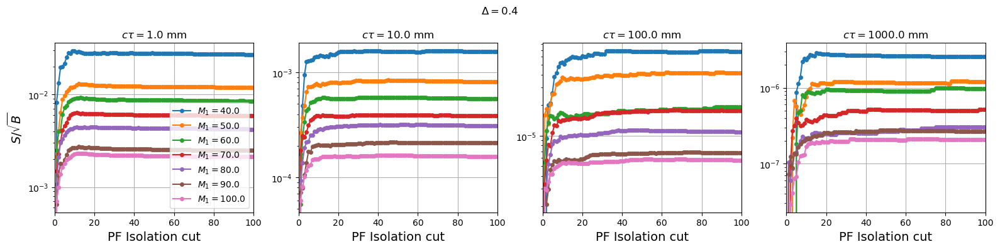

<Figure size 800x600 with 0 Axes>

In [14]:
# N-1 for the vtx_PFIso3
hname = "sel_vtx_PFIso3"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


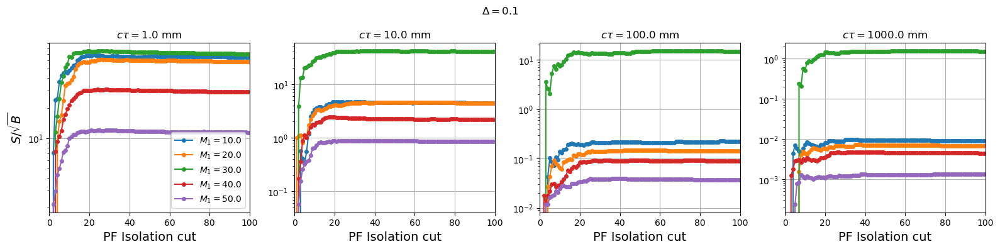

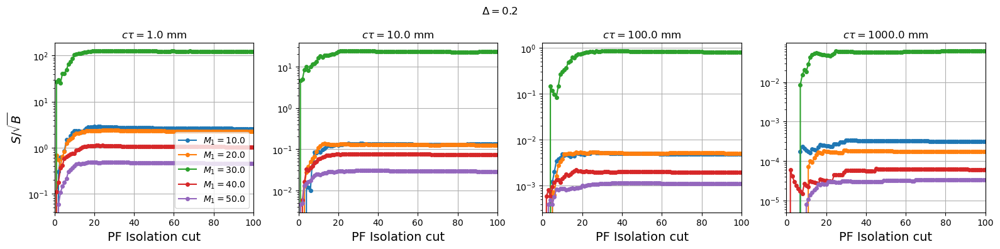

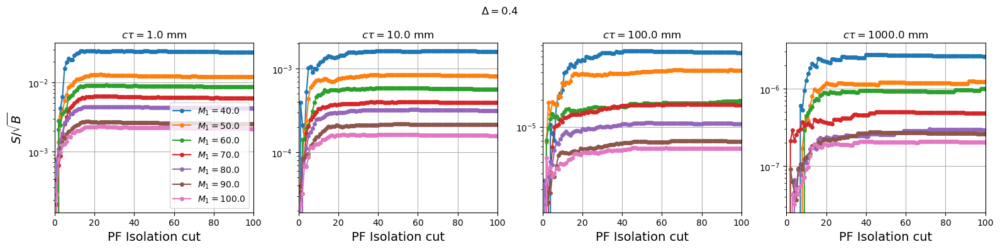

<Figure size 800x600 with 0 Axes>

In [15]:
# N-1 for the vtx_PFIso4
hname = "sel_vtx_PFIso4"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


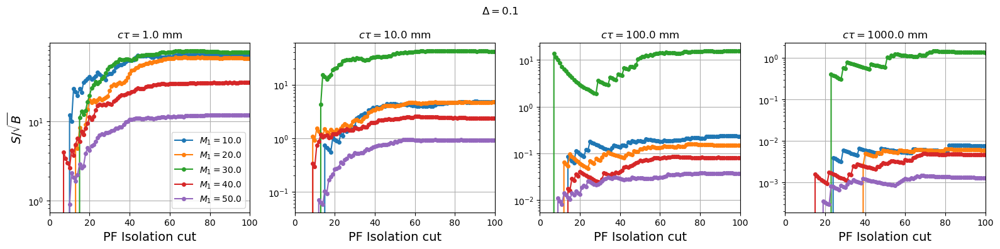

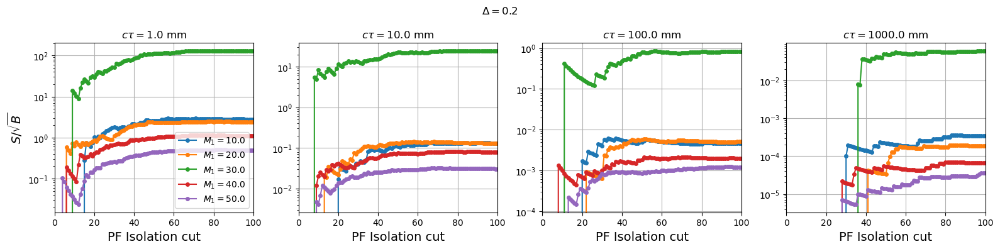

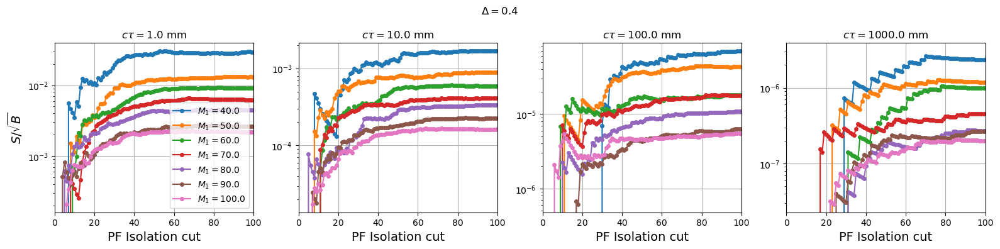

<Figure size 800x600 with 0 Axes>

In [16]:
# N-1 for the vtx_PFIso8
hname = "sel_vtx_PFIso8"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


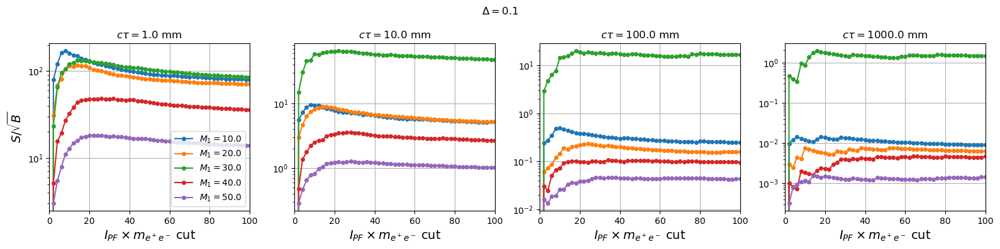

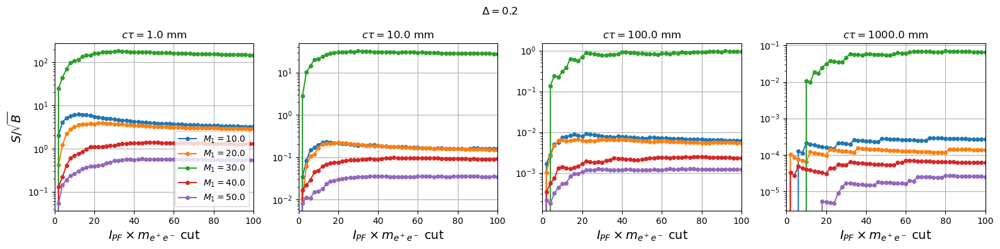

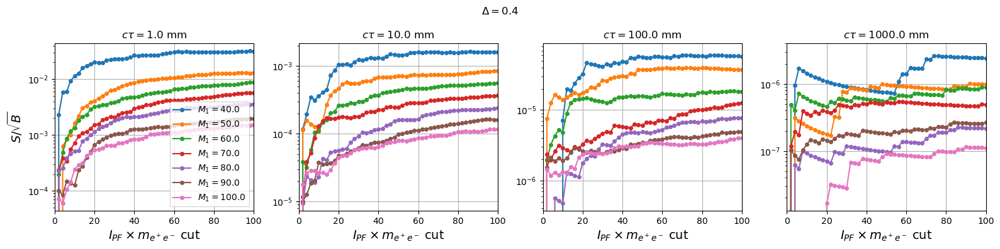

<Figure size 800x600 with 0 Axes>

In [17]:
# N-1 for the vtx_PFIso3 * mass
hname = "sel_vtx_PFIso3M"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


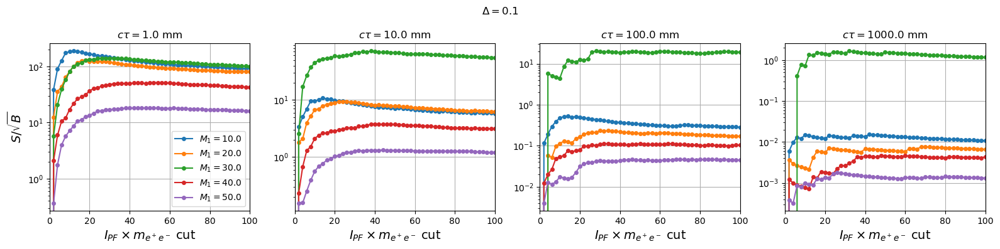

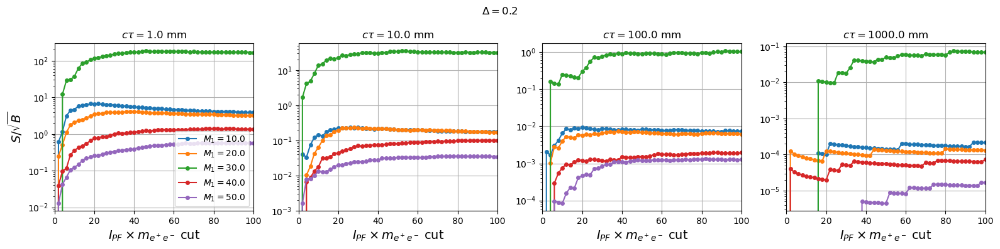

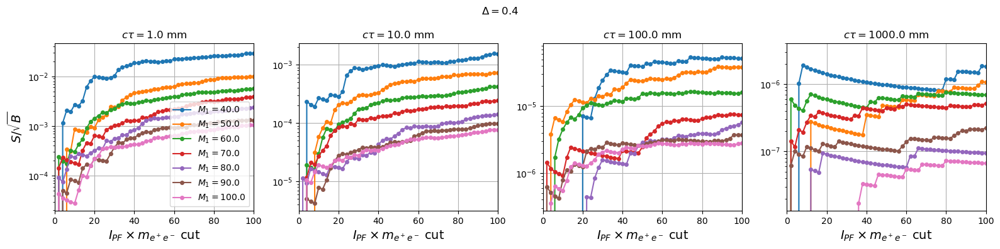

<Figure size 800x600 with 0 Axes>

In [18]:
# N-1 for the vtx_PFIso4 * mass
hname = "sel_vtx_PFIso4M"
plotNminus1(hname,[0,100],logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


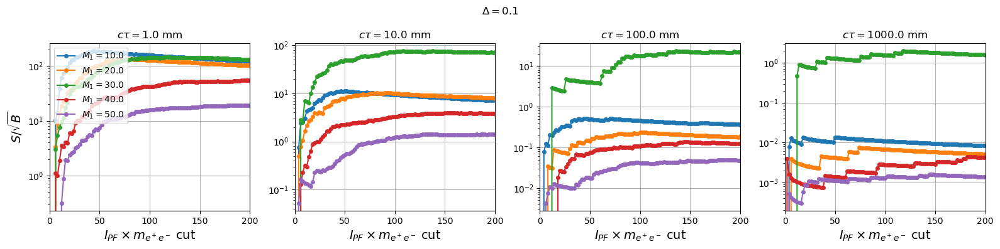

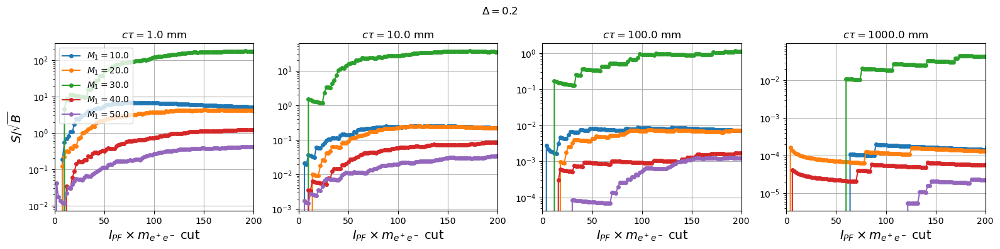

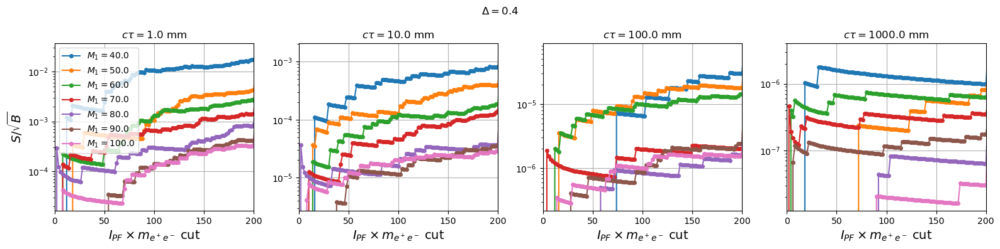

<Figure size 800x600 with 0 Axes>

In [19]:
# N-1 for the vtx_PFIso8 * mass
hname = "sel_vtx_PFIso8M"
plotNminus1(hname,[0,200],logy=True,loc='upper left')

# Vertex Quality

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


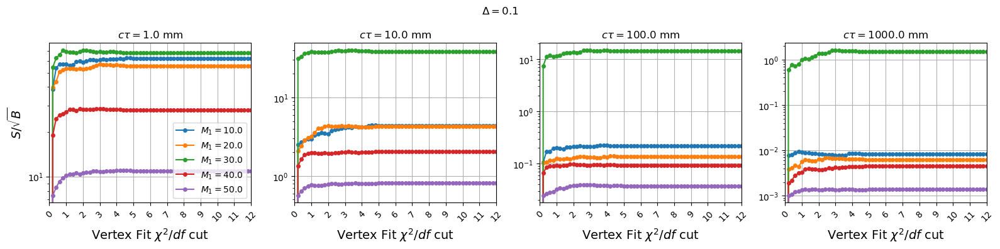

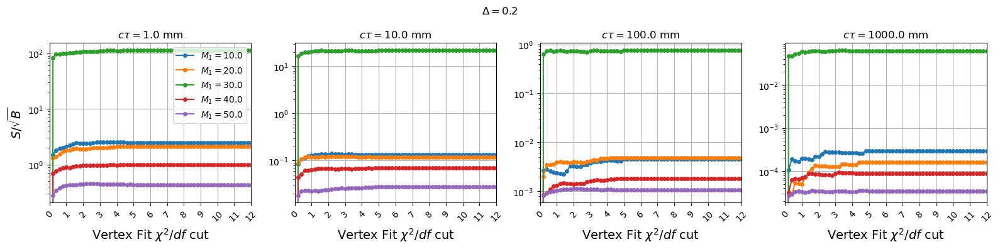

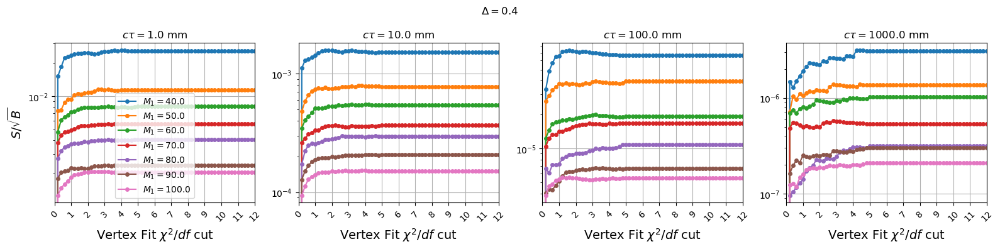

<Figure size 800x600 with 0 Axes>

In [20]:
# N-1 for the vertex chi2
hname = "sel_vtx_chi2"
plotNminus1(hname,[0,12],tickx=1,logy=True)

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


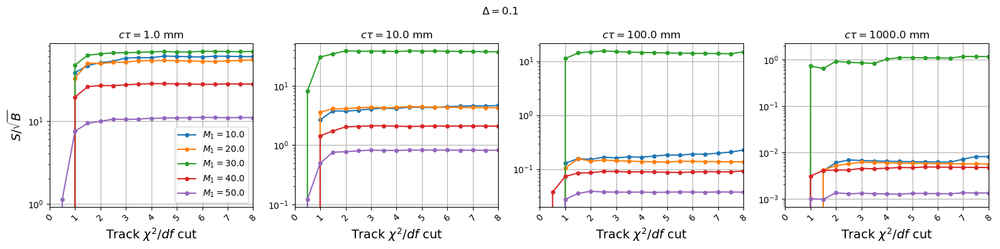

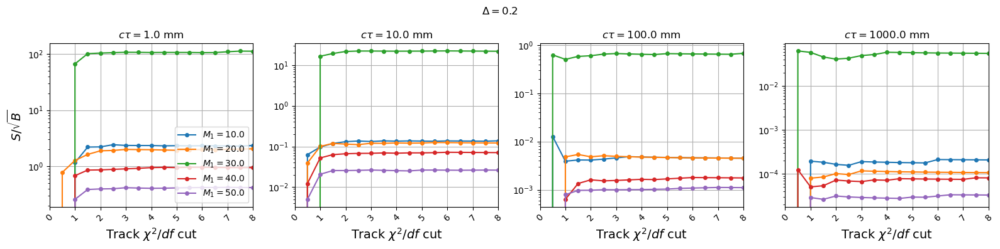

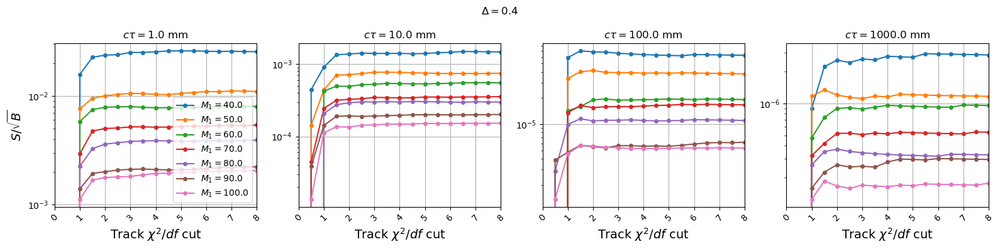

<Figure size 800x600 with 0 Axes>

In [21]:
# N-1 for vtx electron max chi2
hname = "sel_vtx_max_chi2"
plotNminus1(hname,[0,8],tickx=1,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


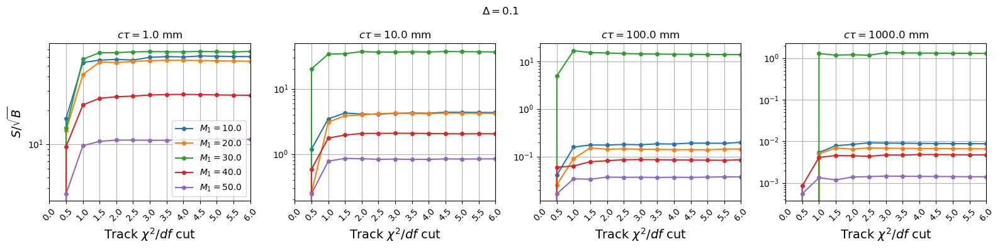

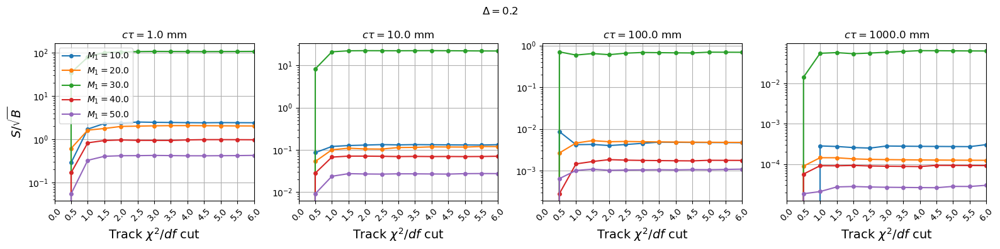

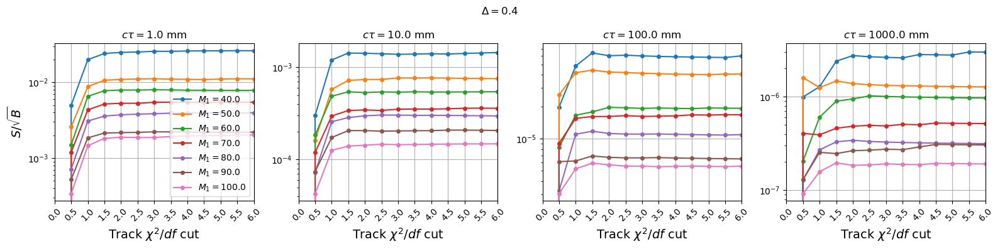

<Figure size 800x600 with 0 Axes>

In [22]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_e1_trkChi2"
plotNminus1(hname,[0,6],tickx=0.5,logy=True)

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


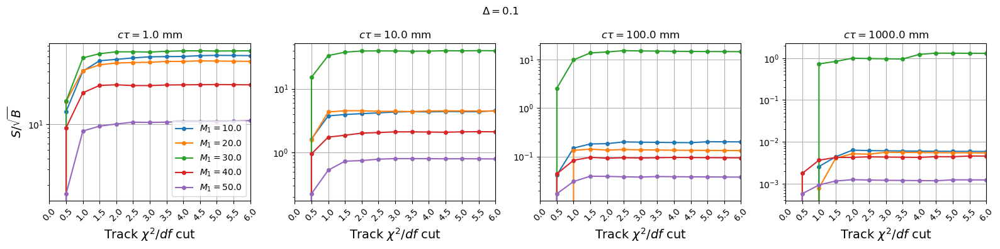

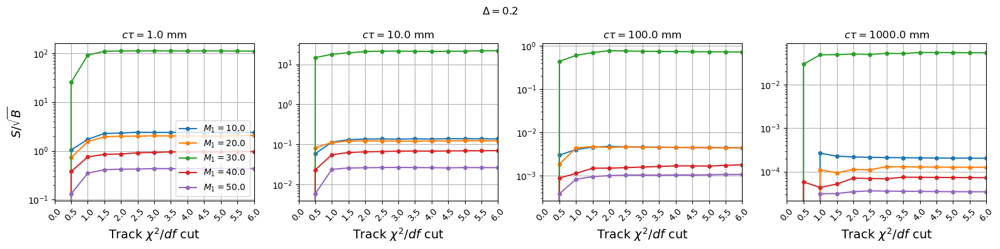

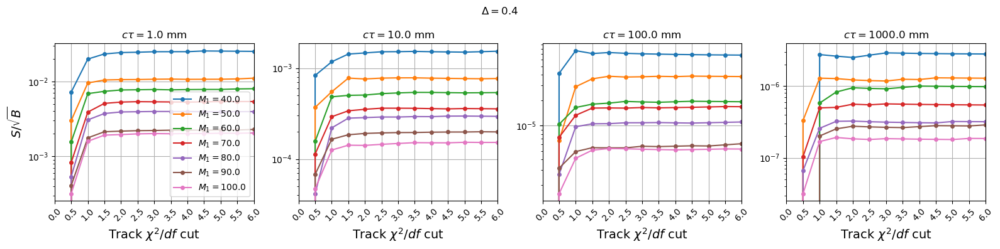

<Figure size 800x600 with 0 Axes>

In [23]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_e2_trkChi2"
plotNminus1(hname,[0,6],tickx=0.5,logy=True,loc='lower right')

# Vertex dR

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


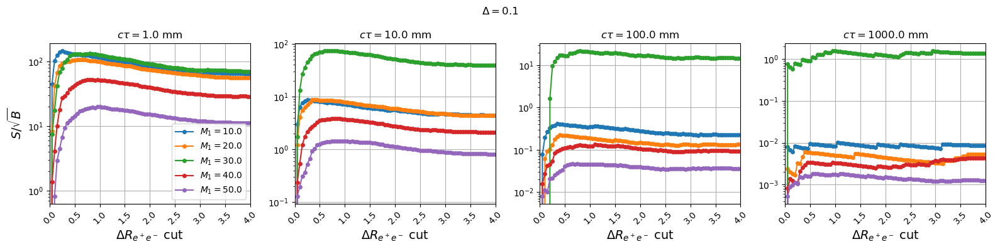

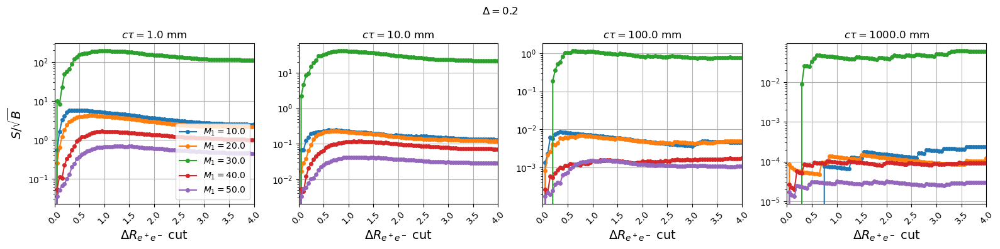

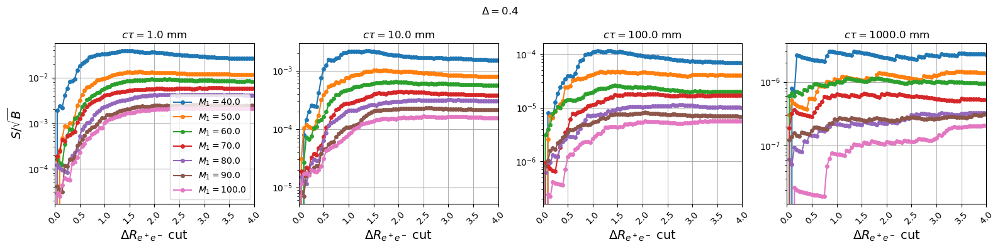

<Figure size 800x600 with 0 Axes>

In [24]:
# N-1 for the vertex dR
cut = "cut11"
hname = "sel_vtx_dR"
plotNminus1(hname,[0,4],tickx=0.5,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


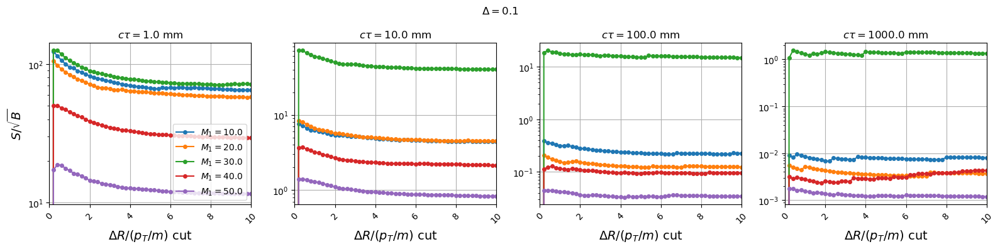

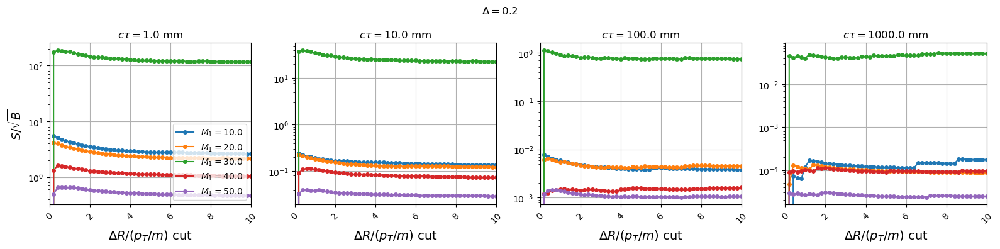

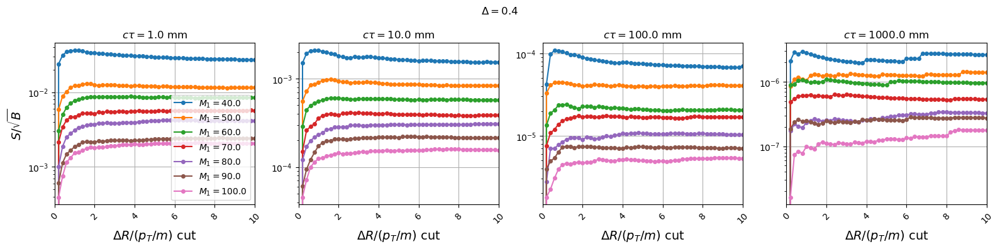

<Figure size 800x600 with 0 Axes>

In [25]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_dR_over_pTm"
plotNminus1(hname,[0,10],tickx=2,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


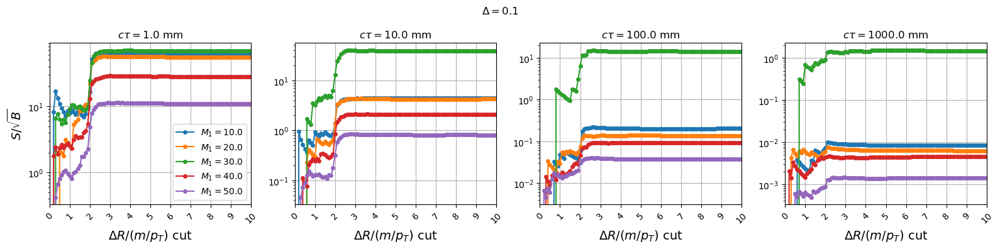

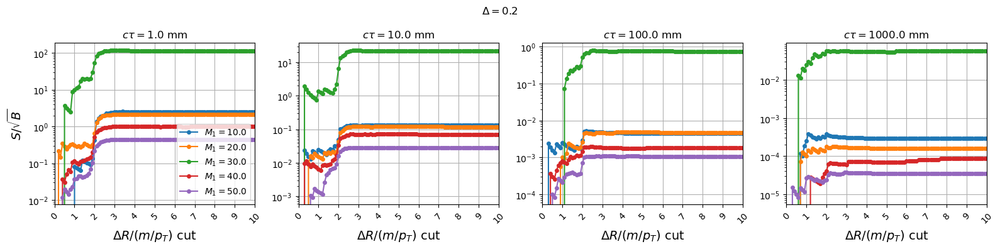

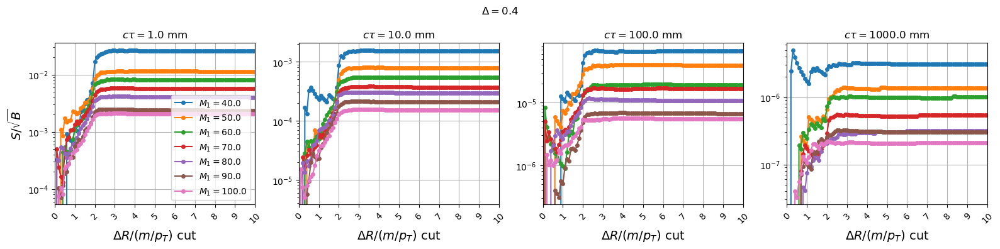

<Figure size 800x600 with 0 Axes>

In [26]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_dR_over_mpT"
plotNminus1(hname,[0,10],tickx=1,logy=True,loc='lower right')

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


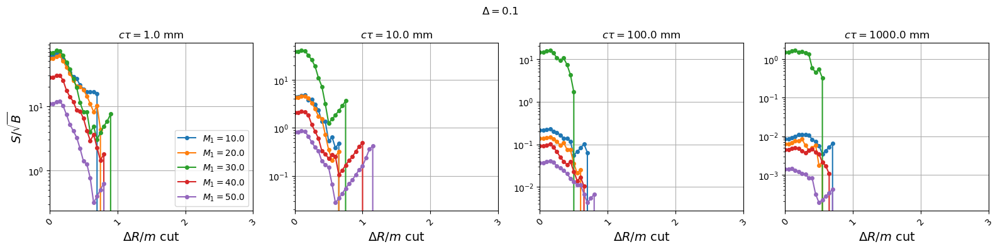

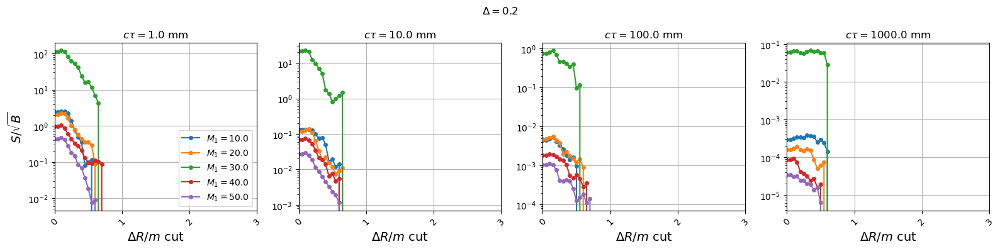

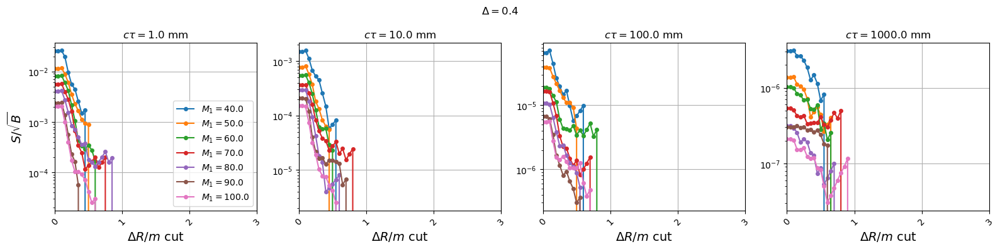

<Figure size 800x600 with 0 Axes>

In [27]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_dR_over_m"
plotNminus1(hname,[0,3],tickx=1,logy=True,loc='lower right',lessThan=False)

/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)
/uscms/home/sbrightt/nobackup/iDM/iDMe_analysis/CMSSW_10_6_26/src/iDMeAnalysis/python_analysis/analysisTools/plotTools.py:22: RuntimeWarning: invalid value encountered in true_divide
  signif = np.where(s2>0,s1/np.sqrt(s2),-1)


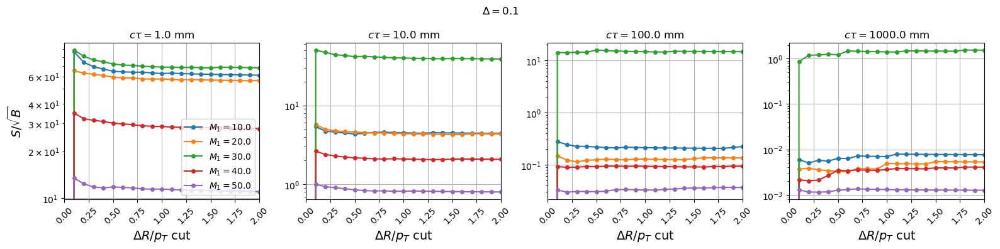

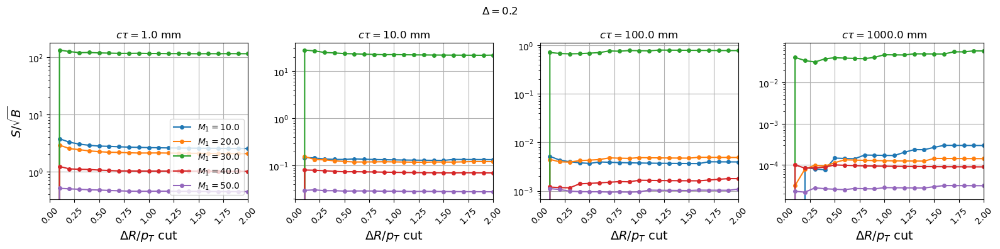

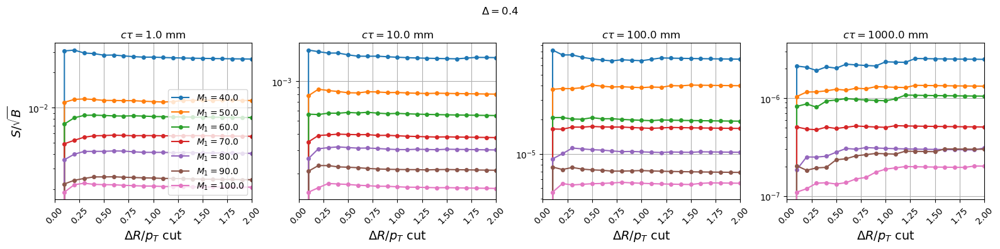

<Figure size 800x600 with 0 Axes>

In [28]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_dR_over_pT"
plotNminus1(hname,[0,2],tickx=0.25,logy=True,loc='lower right')

# Vertex-MET dPhi

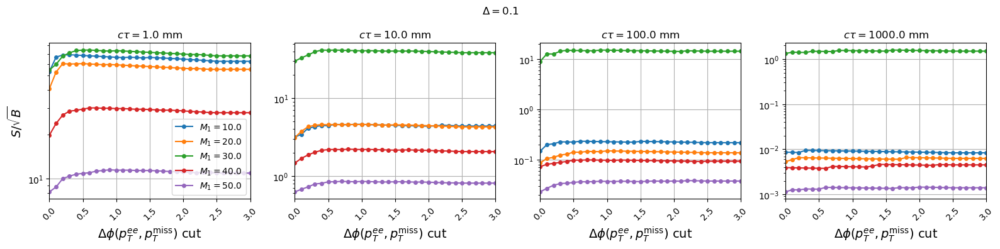

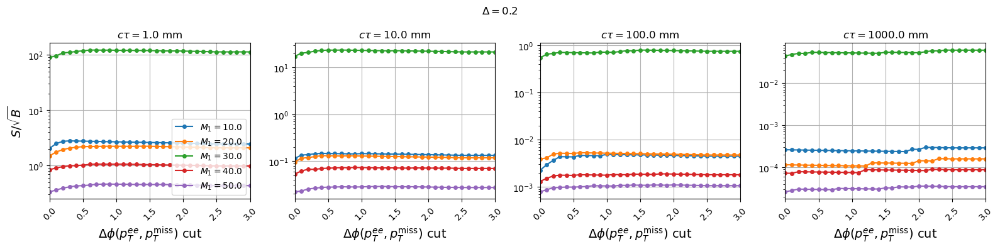

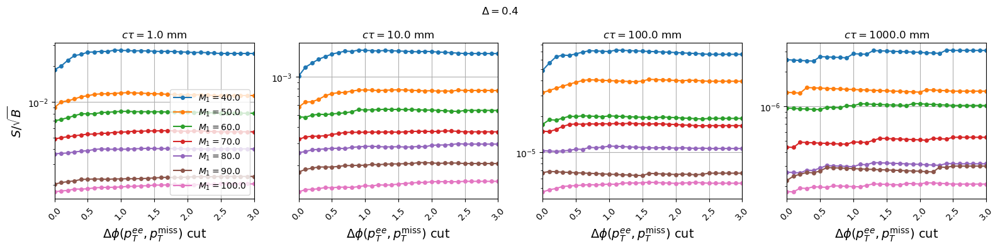

<Figure size 800x600 with 0 Axes>

In [29]:
# N-1 for the electron chi2
cut = "cut11"
hname = "vtx_met_dPhi"
plotNminus1(hname,[0,3],tickx=0.5,logy=True,loc='lower right',xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})$")

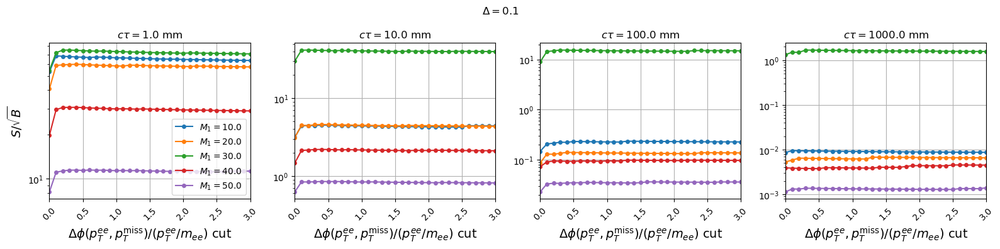

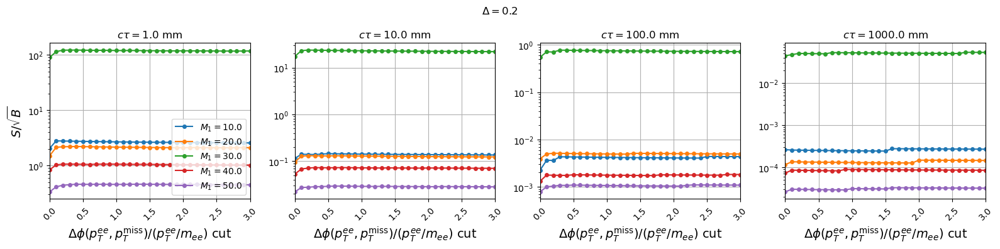

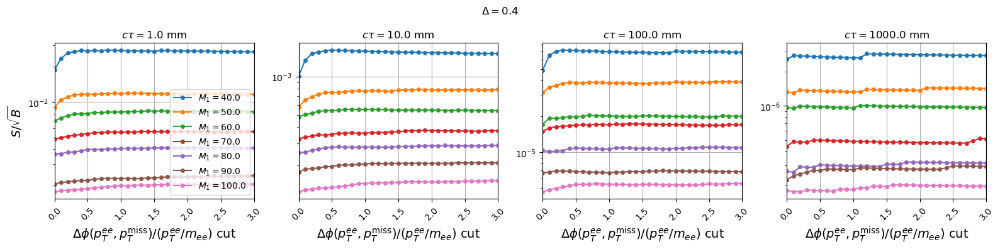

<Figure size 800x600 with 0 Axes>

In [30]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_METdPhi_over_pTm"
plotNminus1(hname,[0,3],tickx=0.5,logy=True,loc='lower right',xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})/(p_T^{ee}/m_{ee})$")

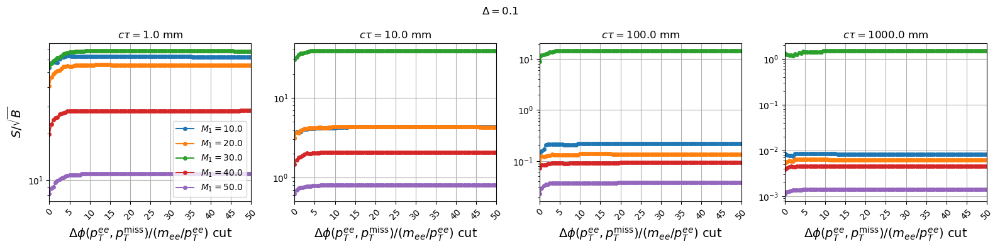

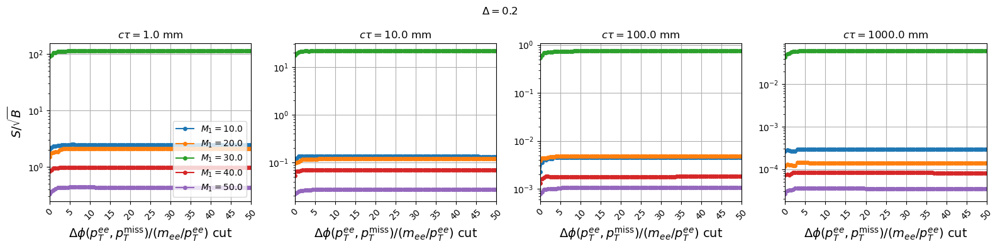

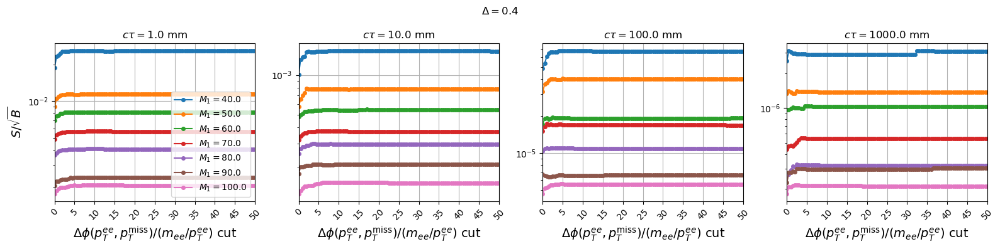

<Figure size 800x600 with 0 Axes>

In [31]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_METdPhi_over_mpT"
plotNminus1(hname,[0,50],tickx=5,logy=True,loc='lower right',xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})/(m_{ee}/p_T^{ee})$")

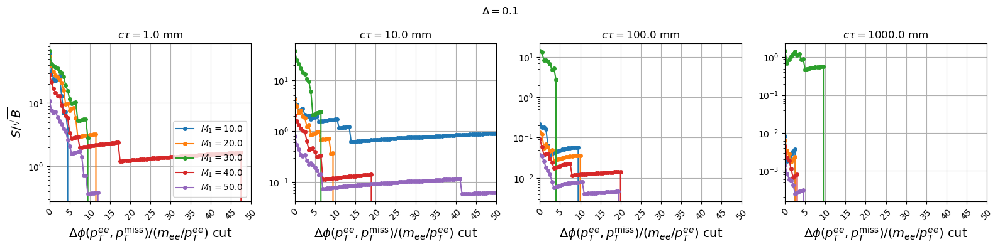

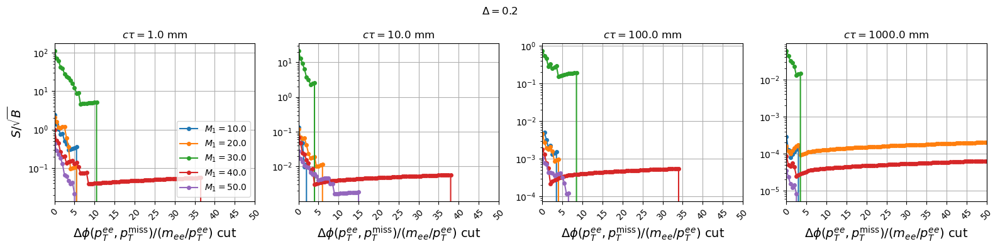

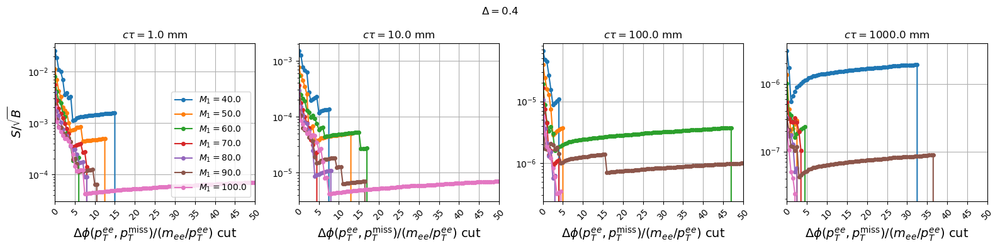

<Figure size 800x600 with 0 Axes>

In [32]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_METdPhi_over_mpT"
plotNminus1(hname,[0,50],tickx=5,logy=True,loc='lower right',lessThan=False,xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})/(m_{ee}/p_T^{ee})$")

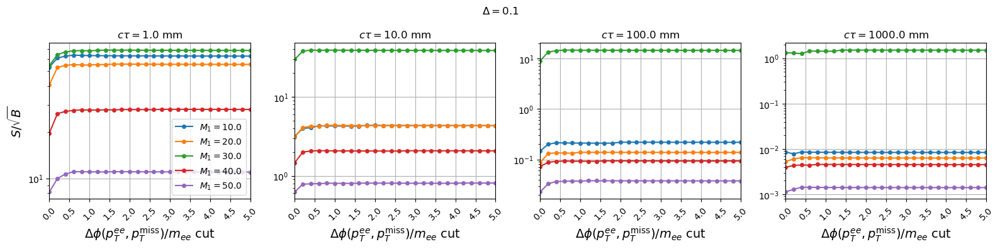

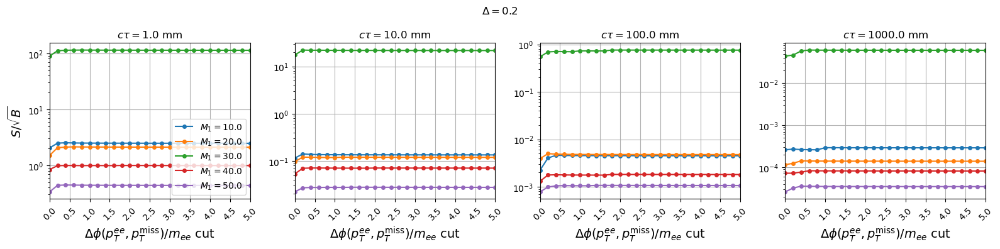

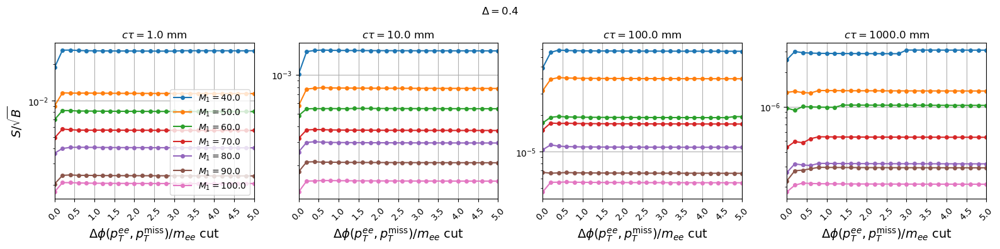

<Figure size 800x600 with 0 Axes>

In [33]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_METdPhi_over_m"
plotNminus1(hname,[0,5],tickx=0.5,logy=True,loc='lower right',xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})/m_{ee}$")

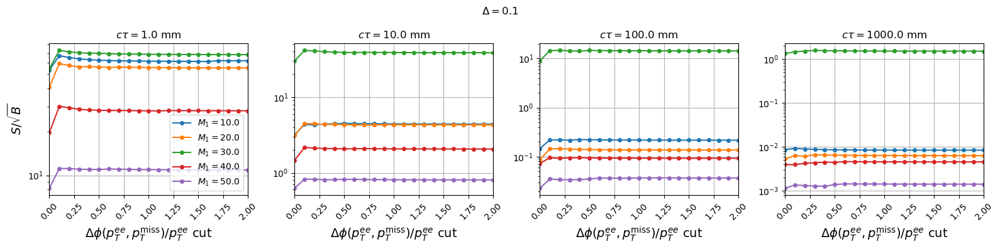

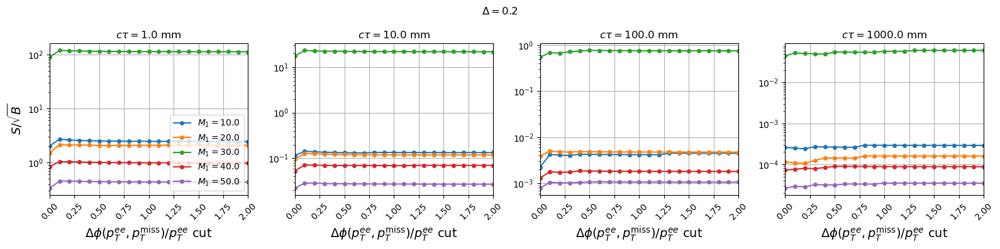

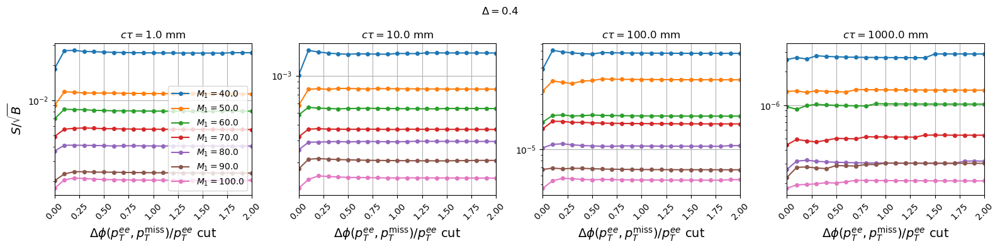

<Figure size 800x600 with 0 Axes>

In [34]:
# N-1 for the electron chi2
cut = "cut11"
hname = "sel_vtx_METdPhi_over_pT"
plotNminus1(hname,[0,2],tickx=0.25,logy=True,loc='lower right',xlabel=r"$\Delta \phi(p_T^{ee},p_T^\mathrm{miss})/p_T^{ee}$")